# Notebook to load clustering results and compare them to reference SEDs (such as CWW-Kinney in LePhare)

Created on : Feb. 6, 2023 by Joseph Chevalier

Last update : Feb. 6, 2023 by Joseph Chevalier

## Imports and settings

In [1]:
import os, sys, re
import pickle
import json
import glob
import collections

import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx
import matplotlib.offsetbox
from matplotlib.backends.backend_pdf import PdfPages
%matplotlib inline
# to enlarge the sizes
params = {'legend.fontsize': 'large',
          'figure.figsize': (12, 8),
         'axes.labelsize': 'xx-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'xx-large',
         'ytick.labelsize':'xx-large'}
plt.rcParams.update(params)
props = dict(boxstyle='round',edgecolor="w",facecolor="w", alpha=0.5)

from itertools import cycle, islice

from astropy.io import fits
from astropy.table import Table
from scipy import ndimage
from scipy.interpolate import interp1d

# Import the primary photometry classes from rubin_sim.photUtils
from rubin_sim.phot_utils import Bandpass
from rubin_sim.phot_utils import Sed
from rubin_sim.data import get_data_dir
from StudyFors2SED.def_raw_seds import *
#from StudyFors2SED.raw_data_analysis import *

pysynphot_root_path=os.environ['PYSYN_CDBS']
path_sed_calspec=os.path.join(pysynphot_root_path,'calspec')
# pysynphot
import pysynphot as S
S.refs.setref(area=1)
S.refs.getref()

{'graphtable': '/home/joseph/local/dir/trds/mtab/57g1733im_tmg.fits',
 'comptable': '/home/joseph/local/dir/trds/mtab/6452249tm_tmc.fits',
 'thermtable': '/home/joseph/local/dir/trds/mtab/3241637sm_tmt.fits',
 'area': 1,
 'waveset': 'Min: 500, Max: 26000, Num: 10000, Delta: None, Log: True'}

In [2]:
def SaveImageInPdf(all_figs,outputfile):
    """
    """
    with PdfPages(outputfile) as pdf:
        for fig in all_figs:
            pdf.savefig(fig)
            plt.close()

In [3]:
root_dir, base_name = os.path.split(os.getcwd())
print(root_dir)

/home/joseph


In [4]:
os.listdir(root_dir)

['.python_history',
 '.condarc',
 'AuxtelEnv',
 'rubin_sim',
 'rubin_sim_data',
 '.stackyter-config.yaml',
 '.landscape',
 '.sudo_as_admin_successful',
 '.gitconfig',
 'Downloads',
 '.conda',
 'PhotoZEnv',
 '.cache',
 '.bash_history',
 '.nedit',
 'anaconda3',
 '.wget-hsts',
 'Spectractor',
 '.motd_shown',
 '.config',
 '.astropy',
 'Anaconda3-2022.10-Linux-x86_64.sh',
 'delegate-contributions-dp02',
 'StackyterEnv',
 'WIP_FORS2',
 '.profile',
 '.jupyter',
 '.ssh',
 '.bash_logout',
 'GMAOMERRA2',
 '.viminfo',
 '.bashrc',
 '.bash_aliases',
 '.mozilla',
 'AuxTelComm',
 '.local',
 'libRadtran',
 'lephare_cosmos',
 'AuxTel_eqw',
 'PhotoZ_PhD',
 'libRadtran-2.0.4.tar.gz',
 'local',
 '.ipython',
 '.dbus']

In [5]:
filename_fits_catalog
t = Table.read(filename_fits_catalog)
t[t["ID"]==106]['z'][0]

/home/joseph/anaconda3/envs/conda_photoZ/lib/python3.11/site-packages/astropy/io/fits/connect.py:276: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask = data[col.name] == col.null


0.6436

In [6]:
print(path_BC)
spec_list = sorted(os.listdir(path_BC))
print(spec_list)

/home/joseph/PhotoZ_PhD/ResStarlight/BC03N/conf1/HZ4/output_rebuild_BC/full_spectra/
['SPEC102_HZ4_BC.txt', 'SPEC106_HZ4_BC.txt', 'SPEC107_HZ4_BC.txt', 'SPEC109_HZ4_BC.txt', 'SPEC110_HZ4_BC.txt', 'SPEC111_HZ4_BC.txt', 'SPEC112_HZ4_BC.txt', 'SPEC113_HZ4_BC.txt', 'SPEC114_HZ4_BC.txt', 'SPEC115_HZ4_BC.txt', 'SPEC117_HZ4_BC.txt', 'SPEC118_HZ4_BC.txt', 'SPEC120_HZ4_BC.txt', 'SPEC121_HZ4_BC.txt', 'SPEC123_HZ4_BC.txt', 'SPEC127_HZ4_BC.txt', 'SPEC128_HZ4_BC.txt', 'SPEC132_HZ4_BC.txt', 'SPEC134_HZ4_BC.txt', 'SPEC135_HZ4_BC.txt', 'SPEC137_HZ4_BC.txt', 'SPEC138_HZ4_BC.txt', 'SPEC13_HZ4_BC.txt', 'SPEC141_HZ4_BC.txt', 'SPEC149_HZ4_BC.txt', 'SPEC151_HZ4_BC.txt', 'SPEC152_HZ4_BC.txt', 'SPEC156_HZ4_BC.txt', 'SPEC160_HZ4_BC.txt', 'SPEC161_HZ4_BC.txt', 'SPEC164_HZ4_BC.txt', 'SPEC171_HZ4_BC.txt', 'SPEC178_HZ4_BC.txt', 'SPEC179_HZ4_BC.txt', 'SPEC181_HZ4_BC.txt', 'SPEC182_HZ4_BC.txt', 'SPEC183_HZ4_BC.txt', 'SPEC184_HZ4_BC.txt', 'SPEC185_HZ4_BC.txt', 'SPEC186_HZ4_BC.txt', 'SPEC187_HZ4_BC.txt', 'SPEC188_HZ4_

In [7]:
all_numbers = [ int(re.findall('^SPEC(.*)_HZ4_BC[.]txt$',fn)[0]) for fn in spec_list ]
all_numbers = sorted(all_numbers)
all_numbers

[2,
 3,
 9,
 13,
 19,
 24,
 25,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 45,
 47,
 49,
 51,
 55,
 57,
 58,
 59,
 61,
 62,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 77,
 79,
 80,
 83,
 84,
 85,
 86,
 87,
 89,
 91,
 93,
 96,
 97,
 102,
 106,
 107,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 117,
 118,
 120,
 121,
 123,
 127,
 128,
 132,
 134,
 135,
 137,
 138,
 141,
 149,
 151,
 152,
 156,
 160,
 161,
 164,
 171,
 178,
 179,
 181,
 182,
 183,
 184,
 185,
 186,
 187,
 188,
 189,
 191,
 192,
 193,
 194,
 196,
 197,
 198,
 204,
 205,
 210,
 214,
 218,
 221,
 222,
 223,
 226,
 227,
 231,
 233,
 234,
 235,
 236,
 237,
 238,
 240,
 242,
 243,
 244,
 245,
 246,
 248,
 249,
 250,
 252,
 253,
 258,
 259,
 260,
 261,
 262,
 264,
 265,
 266,
 267,
 268,
 271,
 274,
 275,
 276,
 277,
 278,
 279,
 280,
 281,
 282,
 283,
 287,
 288,
 291,
 292,
 294,
 295,
 296,
 297,
 298,
 301,
 302,
 303,
 304,
 305,
 306,
 307,
 308,
 309,
 313,
 315,
 317,
 318,
 319,
 321,
 322,
 323,
 324,
 325,
 326,
 327,
 328,

## Load clustering results

In [8]:
clus_dict_file = 'clustersFromSL_Kmean30.pkl'
#clus_dict_file = 'clustersFromSL_KinCal.pkl'
#path_to_pickle = os.path.join(os.getcwd(), 'Clustering', clus_dict_file)
path_to_pickle = os.path.join(os.getcwd(), clus_dict_file)
print(path_to_pickle)

/home/joseph/PhotoZ_PhD/clustersFromSL_Kmean30.pkl


In [9]:
with open(path_to_pickle, 'rb') as f:
    clus_dict = pickle.load(f)
print(clus_dict)

{'KmeanCluster_SL_1': [24, 30, 66, 236, 262, 268, 323, 339, 353, 375, 402, 422, 425, 442, 507, 563, 571, 610, 620, 656, 660, 679, 684, 731], 'KmeanCluster_SL_2': [35, 58, 118, 132, 141, 179, 181, 182, 188, 189, 193, 198, 221, 231, 233, 235, 271, 282, 287, 318, 387, 391, 404, 410, 412, 417, 443, 463, 488, 492, 533, 562, 570, 576, 583, 603, 661, 670, 674, 682, 695, 701, 735], 'KmeanCluster_SL_3': [294, 307, 461, 483, 564, 582, 593], 'KmeanCluster_SL_4': [36, 61, 111, 240, 245, 279, 280, 281, 336, 365, 374, 384, 388, 400, 403, 421, 435, 437, 532, 535, 549, 556, 600, 643, 645, 683, 719, 733], 'KmeanCluster_SL_5': [3, 49, 89, 96, 123, 135, 191, 205, 302, 348, 370, 431, 553, 575], 'KmeanCluster_SL_6': [218, 223, 632], 'KmeanCluster_SL_7': [128, 237, 276, 354, 464, 470, 505, 579, 595, 630, 680, 704, 707, 734], 'KmeanCluster_SL_8': [47, 57, 226, 475, 526, 527, 529], 'KmeanCluster_SL_9': [13, 32, 51, 59, 91, 151, 267, 297, 399, 518, 710], 'KmeanCluster_SL_10': [19, 37, 69, 178, 197, 258, 275, 3

## Define a distance between two spectra

In [10]:
def dist_spec(spec_arr, refSpec_arr, lambdas, KL_div=False, lambda_min=1000., lambda_max=10000., lambda_step=10.):
    mask = (lambdas>=lambda_min) * (lambdas<= lambda_max)
    if KL_div:
        _diff = spec_arr[mask]*np.log(spec_arr[mask]/refSpec_arr[mask])
    else:
        _diff = np.power(spec_arr[mask]-refSpec_arr[mask], 2.)
    dist = np.sum(_diff)
    return dist

# Loop on dictionary and its components to compute an average spectrum

In [11]:
df_avg_spec = pd.DataFrame()
df_avg_spec_normed = pd.DataFrame()
_l1 = np.arange(100., 1000., 10)
_l2 = np.arange(1000., 11000., 1)
_l3 = np.arange(11000., 100000., 50)
lambdas = np.append(_l1, np.append(_l2, _l3))
mask = (lambdas >= 1000.)*(lambdas <= 10000.)
df_avg_spec['Wavelength'] = lambdas
df_avg_spec_normed['Wavelength'] = lambdas
new_clus_dict={}
avg_zs = np.empty_like([])
sigma_zs = np.empty_like([])
for key in clus_dict:
    _redshifts = np.empty_like([])
    _spec_arr = np.empty_like(lambdas)
    _normSpec_arr = np.empty_like(lambdas)
    Nspec = len(clus_dict[key])
    _dict = {}
    _dict['ID'] = clus_dict[key]
    
    for spec_id in clus_dict[key]:
        spec_path = os.path.join(path_BC, f'SPEC{spec_id}_HZ4_BC.txt')
        spec_arr = np.loadtxt(spec_path)
        spec_fonc = interp1d(spec_arr[:-1, 0], spec_arr[:-1, 1], bounds_error=False, fill_value=0.)
        lumins = spec_fonc(lambdas)
        _norm = np.trapz(lumins[mask], lambdas[mask])
        normed_spec = lumins/_norm
        _redshifts = np.append(_redshifts, t[t['ID']==spec_id]['z'][0])
        _spec_arr = np.column_stack((_spec_arr, lumins))
        _normSpec_arr = np.column_stack((_normSpec_arr, normed_spec))
    
    _dict['z_s'] = _redshifts.tolist()
    new_clus_dict[key] = _dict
    _avg_z = np.mean(_redshifts)
    avg_zs = np.append(avg_zs, _avg_z)
    _sigma_z = np.std(_redshifts)
    sigma_zs = np.append(sigma_zs, _sigma_z)
    _spec_arr = _spec_arr[:,1:]
    _normSpec_arr = _normSpec_arr[:,1:]
    avg_spec = np.mean(_spec_arr, axis=1, dtype=np.float64)
    sigma_spec = np.std(_spec_arr, axis=1, dtype=np.float64)
    avg_normed_spec = np.mean(_normSpec_arr, axis=1, dtype=np.float64)
    sigma_normed_spec = np.std(_normSpec_arr, axis=1, dtype=np.float64)
    df_avg_spec[f'AVG_{key}'] = avg_spec
    df_avg_spec[f'SIG_{key}'] = sigma_spec
    df_avg_spec_normed[f'AVG_{key}_normed'] = avg_normed_spec
    df_avg_spec_normed[f'SIG_{key}_normed'] = sigma_normed_spec
#new_clus_dict

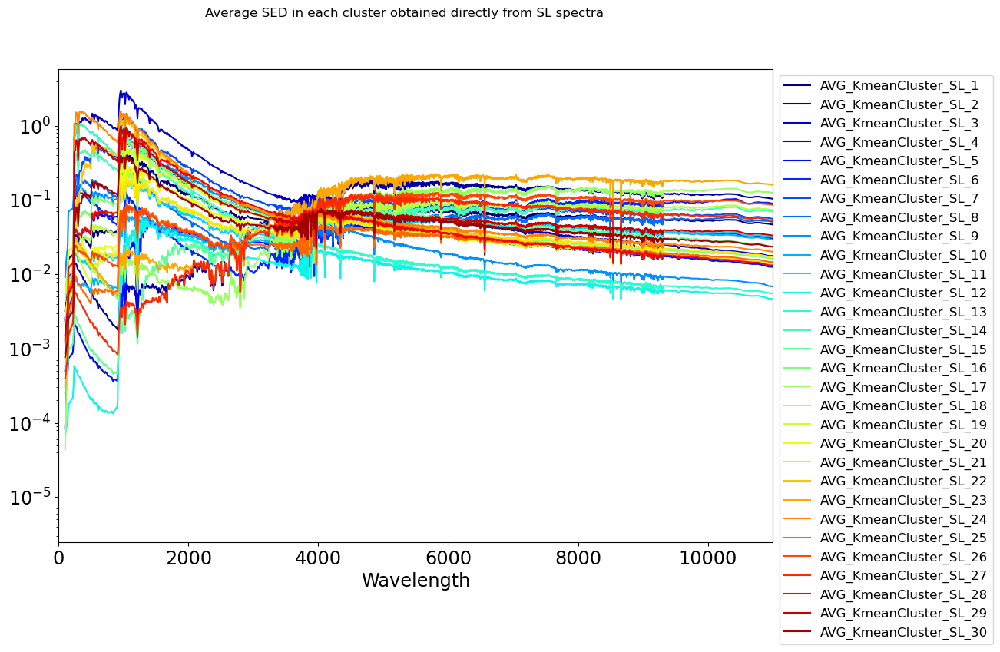

In [12]:
f, a = plt.subplots(1,1)
NTOPLOT=len(df_avg_spec.columns[1:])
jet = plt.get_cmap('jet')
cNorm = colors.Normalize(vmin=0, vmax=NTOPLOT)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
all_colors_clu = scalarMap.to_rgba(np.arange(NTOPLOT), alpha=1)
for idy in np.arange(1, len(df_avg_spec.columns[1:])+1):
    key = str(df_avg_spec.columns[idy])
    if 'AVG' in key:
        df_avg_spec.plot('Wavelength', key, ax=a, color=all_colors_clu[idy-1], legend=False)
    a.set_yscale('log')
    a.legend(loc='upper left', bbox_to_anchor=(1.,1.))
    f.suptitle('Average SED in each cluster obtained directly from SL spectra')
    #a.set_xscale('log')
    a.set_xlim(0,11000)

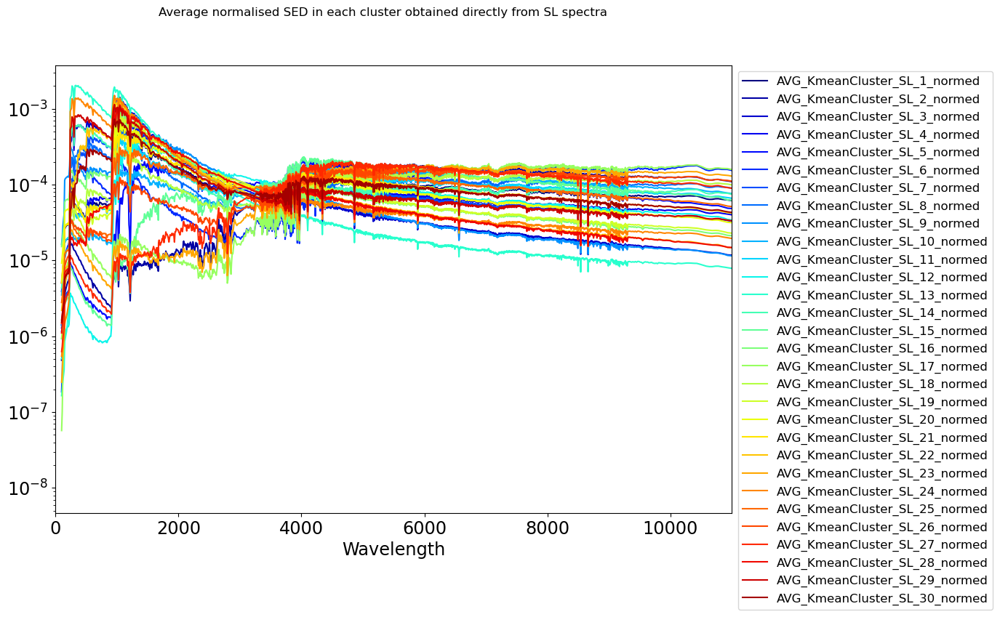

In [13]:
f, a = plt.subplots(1,1)
for idy in np.arange(1, len(df_avg_spec_normed.columns[1:])+1):
    key = str(df_avg_spec_normed.columns[idy])
    if 'AVG' in key:
        df_avg_spec_normed.plot('Wavelength', key, ax=a, color=all_colors_clu[idy-1], legend=False)
    a.set_yscale('log')
    a.legend(loc='upper left', bbox_to_anchor=(1.,1.))
    f.suptitle('Average normalised SED in each cluster obtained directly from SL spectra')
    #a.set_xscale('log')
    a.set_xlim(0,11000)

In [14]:
extr_clus_dict = {}
extr_clus_dict_normed = {}
df_extr_spec = pd.DataFrame()
df_extr_spec_normed = pd.DataFrame()
df_extr_spec['Wavelength'] = lambdas
df_extr_spec_normed['Wavelength'] = lambdas
for key in clus_dict:
    avg_spec = np.zeros_like(lambdas)
    avg_normed_spec = np.zeros_like(lambdas)
    Nspec = len(clus_dict[key])
    _redshifts = np.empty_like([])
    _spec_arr = np.empty_like(lambdas)
    _normSpec_arr = np.empty_like(lambdas)
    dist_max=-1.
    if len(clus_dict[key]) > 1:
        loc = 0
        for spec_id in clus_dict[key]:
            loc+=1
            #_others = [s for s in clus_dict[key] if s != spec_id]
            _others = clus_dict[key][loc:]
            #print(spec_id, clus_dict[key], _others)
            spec_path = os.path.join(path_BC, f'SPEC{spec_id}_HZ4_BC.txt')
            spec_arr = np.loadtxt(spec_path)
            spec_fonc = interp1d(spec_arr[:-1, 0], spec_arr[:-1, 1])
            lumins = spec_fonc(lambdas)
            _norm = np.trapz(lumins[mask], lambdas[mask])
            normed_spec = lumins/_norm
            for other_id in _others:
                oth_spec_path = os.path.join(path_BC, f'SPEC{other_id}_HZ4_BC.txt')
                oth_spec_arr = np.loadtxt(oth_spec_path)
                oth_spec_fonc = interp1d(oth_spec_arr[:-1, 0], oth_spec_arr[:-1, 1])
                oth_lumins = spec_fonc(lambdas)
                _oth_norm = np.trapz(oth_lumins[mask], lambdas[mask])
                oth_normed_spec = oth_lumins/_oth_norm
                _dist = dist_spec(oth_normed_spec, normed_spec, lambdas)
                if _dist > dist_max:
                    dist_max = _dist
                    id1, id2 = spec_id, other_id
                    spec1, spec2 = lumins, oth_lumins
                    spec1_normed, spec2_normed = normed_spec, oth_normed_spec

        extr_clus_dict[f'EXT1_{key}_id{id1}'] = np.column_stack((lambdas, spec1))
        extr_clus_dict_normed[f'EXT1_{key}_id{id1}_normed'] = np.column_stack((lambdas, spec1_normed))
        df_extr_spec[f'EXT1_{key}_id{id1}'] = spec1
        df_extr_spec_normed[f'EXT1_{key}_id{id1}_normed'] = spec1_normed

        extr_clus_dict[f'EXT2_{key}_id{id2}'] = np.column_stack((lambdas, spec2))
        extr_clus_dict_normed[f'EXT2_{key}_id{id2}_normed'] = np.column_stack((lambdas, spec2_normed))
        df_extr_spec[f'EXT2_{key}_id{id2}'] = spec2
        df_extr_spec_normed[f'EXT2_{key}_id{id2}_normed'] = spec2_normed

## Load CWW-Kinney data from files in LEPHARE

In [15]:
if os.getenv('LEPHAREDIR') is not None:
    LEPHAREDIR = os.getenv('LEPHAREDIR')
else:
    LEPHAREDIR = os.path.abspath(os.path.join(os.getcwd(), "LEPHARE"))
print(LEPHAREDIR)
ref_seds = 'CWW_KINNEY'
sed_dir = os.path.join(LEPHAREDIR, 'sed/GAL', ref_seds)
print(sed_dir)

lephare_res_dir = 'lephare_cosmos'
if os.getenv('LEPHAREWORK') is not None:
    LEPHAREWORK = os.environ['LEPHAREWORK']
else:
    LEPHAREWORK = os.path.abspath(os.path.join(os.getcwd(),lephare_res_dir))
    os.environ['LEPHAREWORK'] = LEPHAREWORK

/home/joseph/PhotoZ_PhD/LEPHARE
/home/joseph/PhotoZ_PhD/LEPHARE/sed/GAL/CWW_KINNEY


In [16]:
fmt='.sed'
seds = []
for f in os.listdir(sed_dir):
    if fmt in f:
        seds.append(f)
print(seds)

['CWW_Sbc_ext.sed', 'KIN_SB2_ext.sed', 'KIN_SB3_ext.sed', 'KIN_SB6_ext.sed', 'KIN_SB5_ext.sed', 'KIN_SB4_ext.sed', 'CWW_E_ext.sed', 'CWW_Im_ext.sed', 'KIN_SB1_ext.sed', 'CWW_Scd_ext.sed', 'KIN_Sb_ext.sed', 'KIN_Sa_ext.sed']


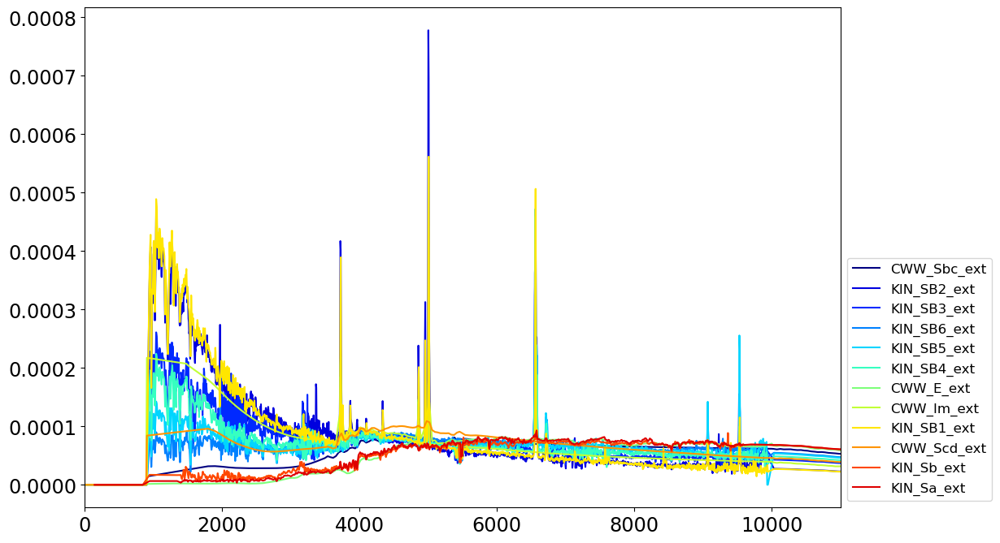

In [17]:
NrefSEDs=len(seds)
jet = plt.get_cmap('jet')
cNorm = colors.Normalize(vmin=0, vmax=NrefSEDs)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
all_colors_refs = scalarMap.to_rgba(np.arange(NrefSEDs), alpha=1)

f, a = plt.subplots(1,1)
for sed, c in zip(seds, all_colors_refs):
    sed_arr = np.loadtxt(os.path.join(sed_dir, sed))
    mask = (sed_arr[:,0] >= 1000.) * (sed_arr[:,1] <= 10000.)
    norm = np.trapz(sed_arr[:,1][mask], sed_arr[:,0][mask])
    a.plot(sed_arr[:, 0], sed_arr[:, 1]/norm, label=sed.split('.')[0], color=c)

a.set_xlim(0., 11000.)
#a.set_yscale('log')
a.legend(loc='lower left', bbox_to_anchor = (1., 0.))

In [18]:
df_cww_spec = pd.DataFrame()
df_cww_spec_normed = pd.DataFrame()
df_cww_spec['Wavelength'] = lambdas
df_cww_spec_normed['Wavelength'] = lambdas
for sed in seds:
    spec_path = os.path.join(sed_dir, sed)
    spec_arr = np.loadtxt(spec_path)
    spec_fonc = interp1d(spec_arr[:-1, 0], spec_arr[:-1, 1], bounds_error=False, fill_value=0.)
    lumins = spec_fonc(lambdas)
    mask = (lambdas >= 1000.)*(lambdas <= 10000.)
    _norm = np.trapz(lumins[mask], lambdas[mask])
    normed_spec = lumins/_norm
    df_cww_spec[ sed.split('.')[0] ] = lumins
    df_cww_spec_normed[ f"{sed.split('.')[0]}_norm" ] = normed_spec
sorted(df_cww_spec_normed.keys())

['CWW_E_ext_norm',
 'CWW_Im_ext_norm',
 'CWW_Sbc_ext_norm',
 'CWW_Scd_ext_norm',
 'KIN_SB1_ext_norm',
 'KIN_SB2_ext_norm',
 'KIN_SB3_ext_norm',
 'KIN_SB4_ext_norm',
 'KIN_SB5_ext_norm',
 'KIN_SB6_ext_norm',
 'KIN_Sa_ext_norm',
 'KIN_Sb_ext_norm',
 'Wavelength']

## Plot SEDs from clustering vs. CWW-Kinney

/tmp/ipykernel_2422/170073640.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1)


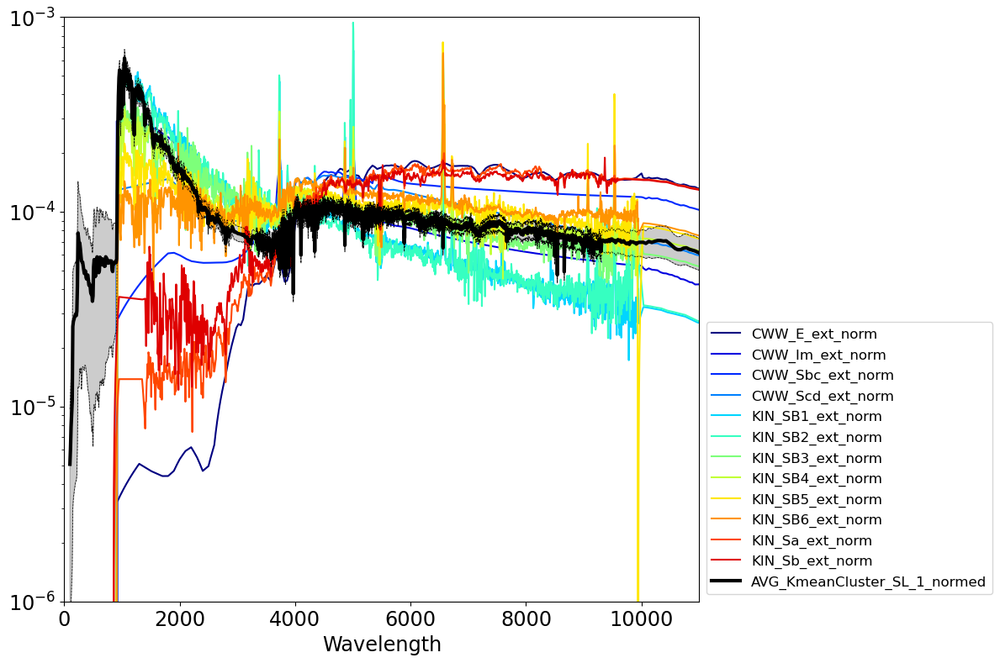

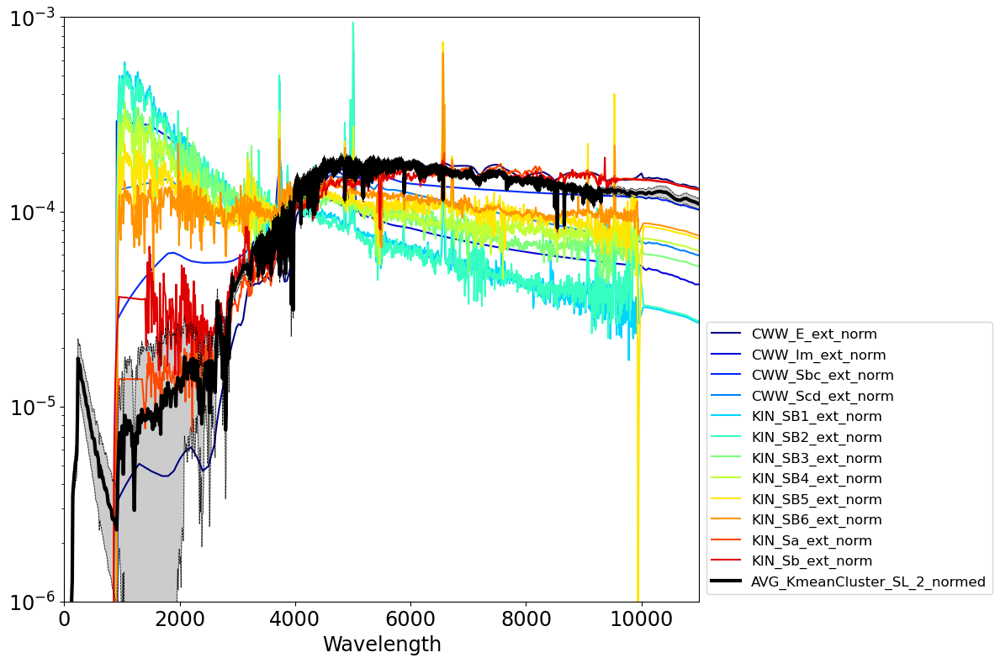

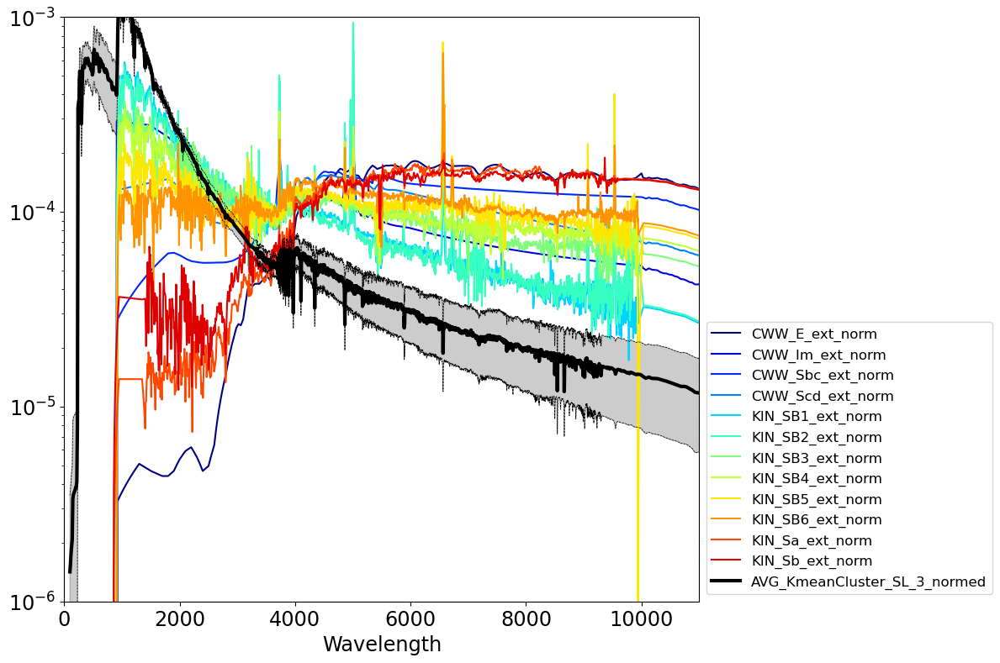

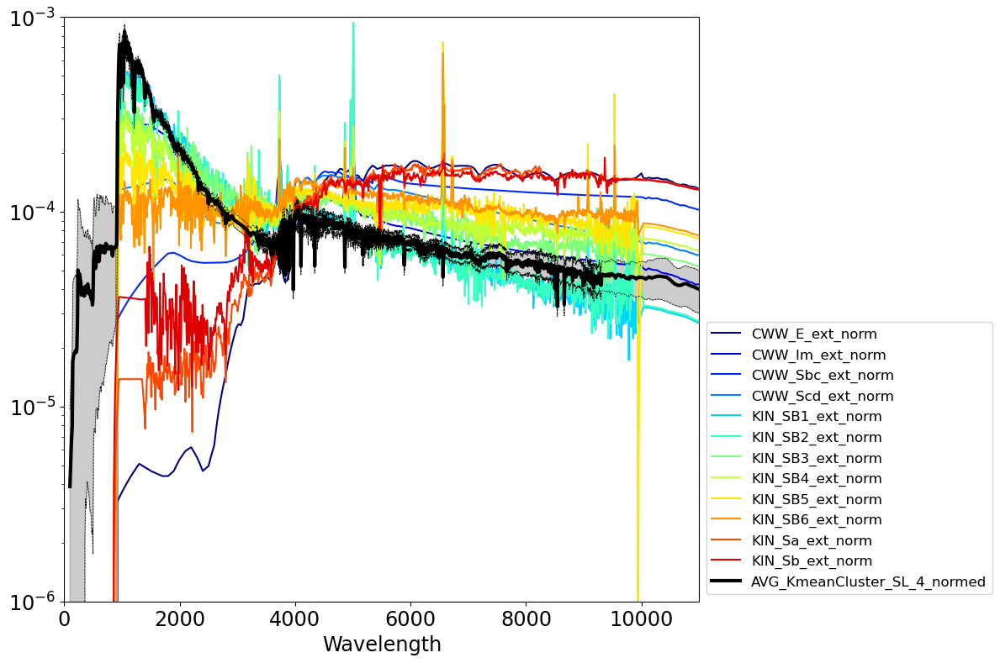

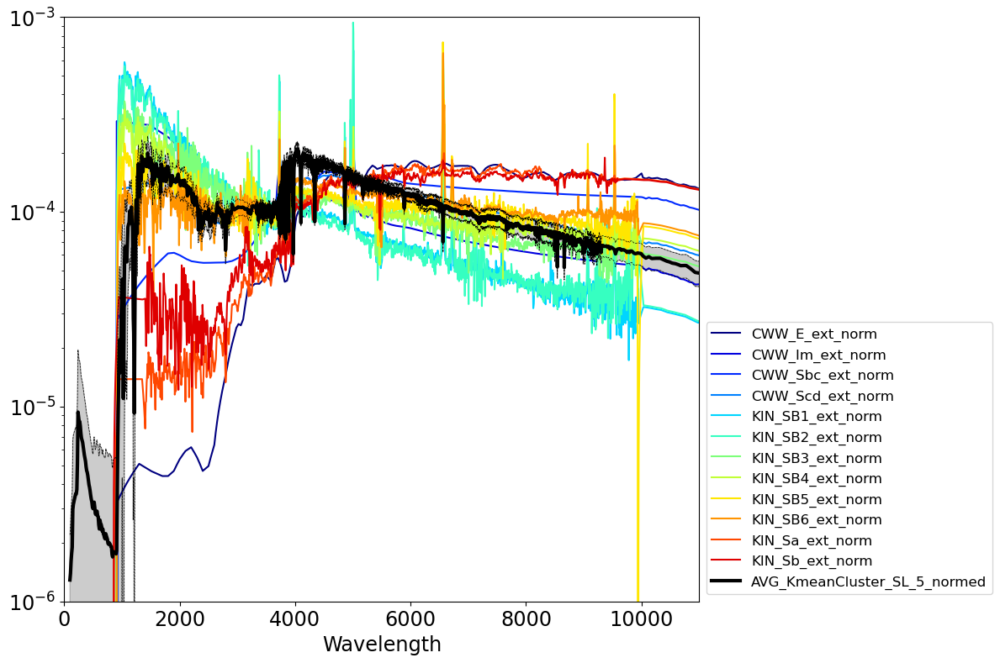

...

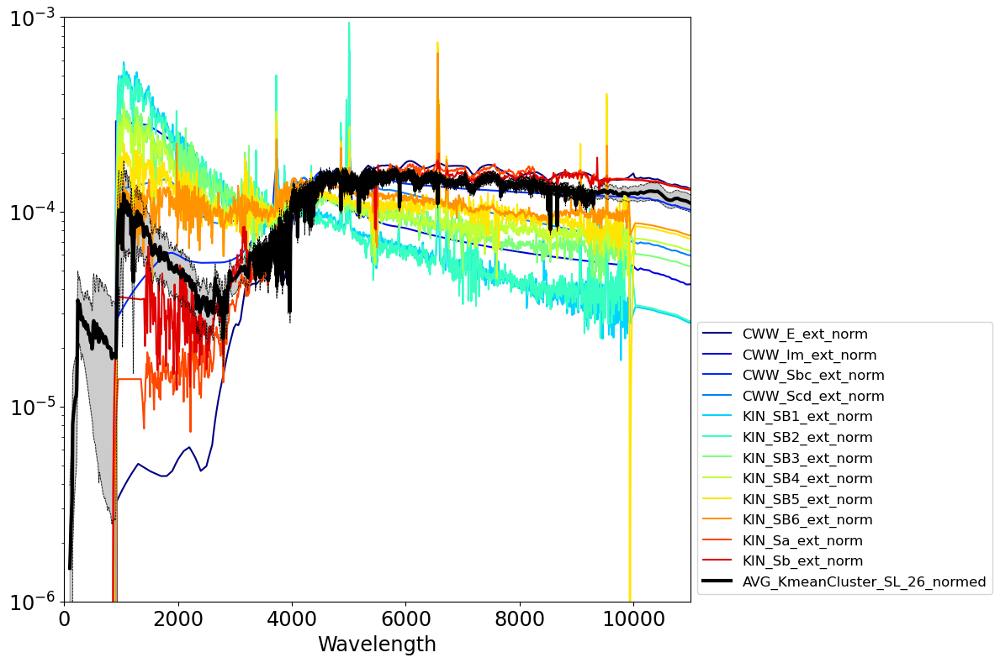

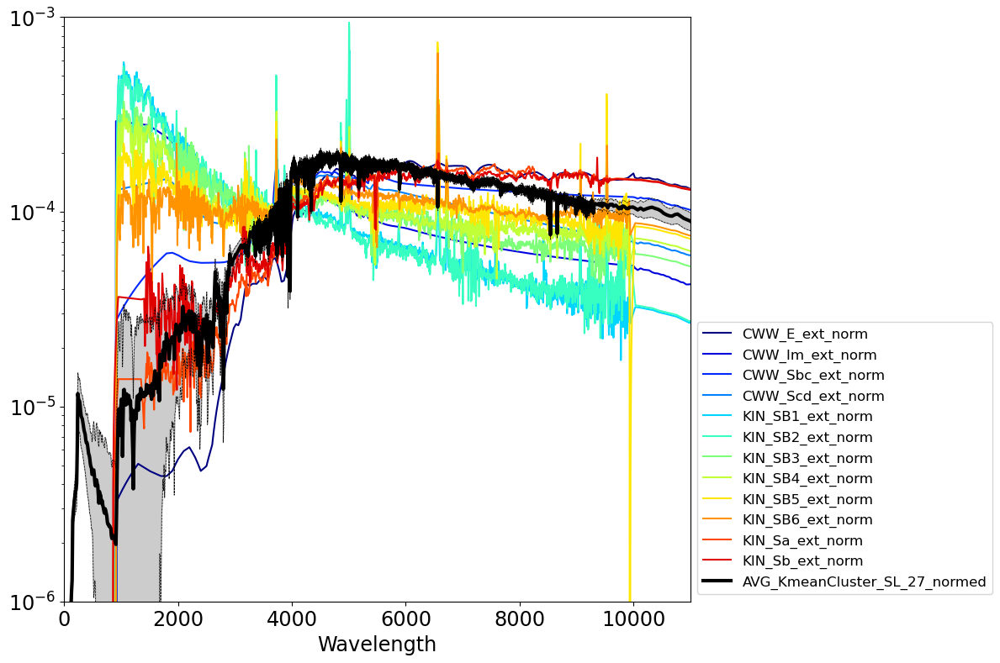

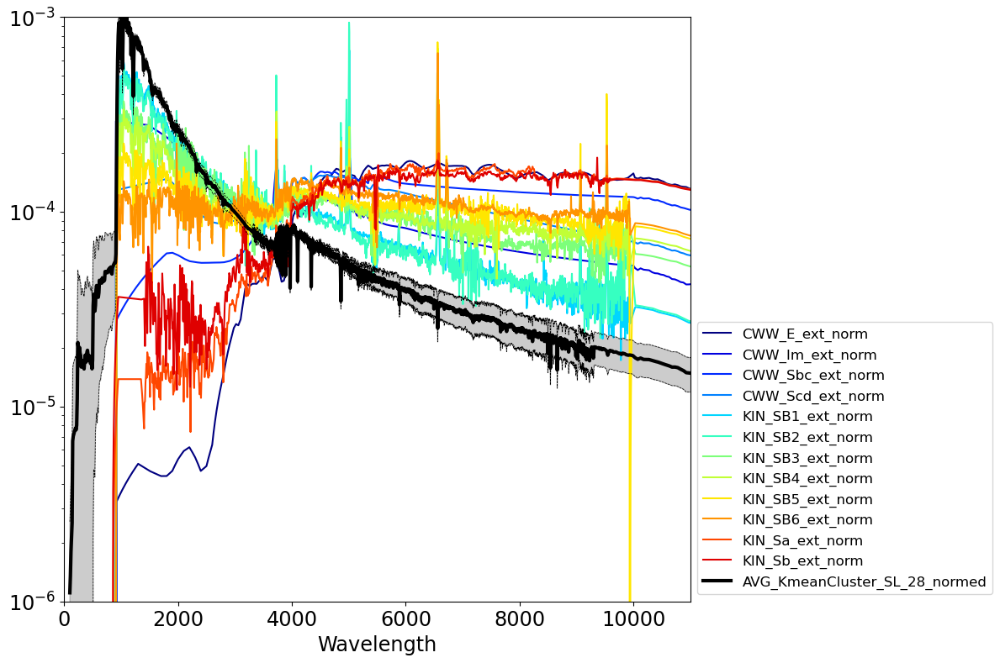

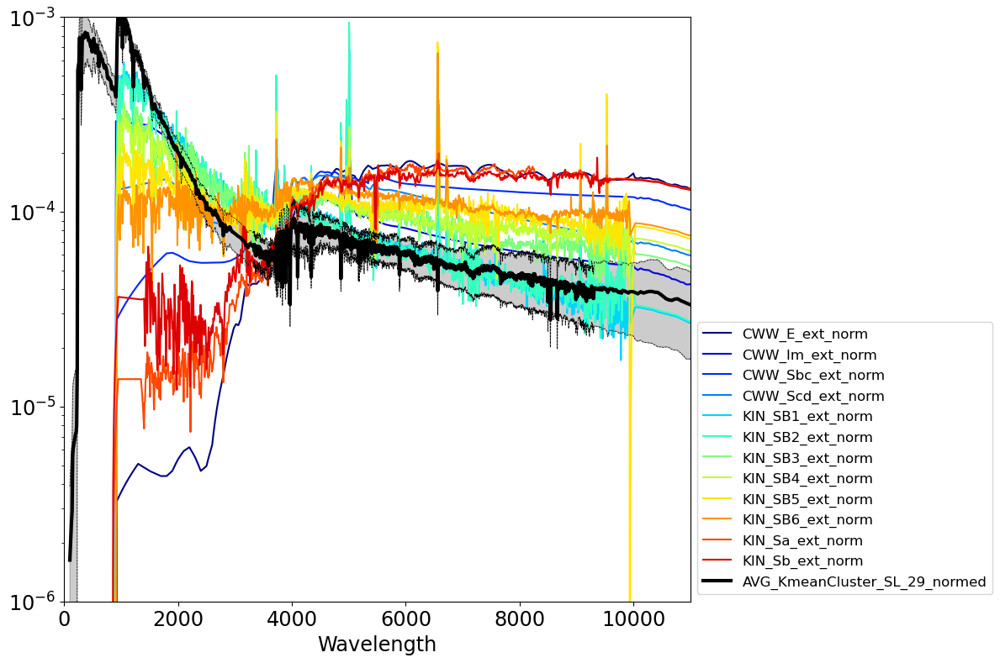

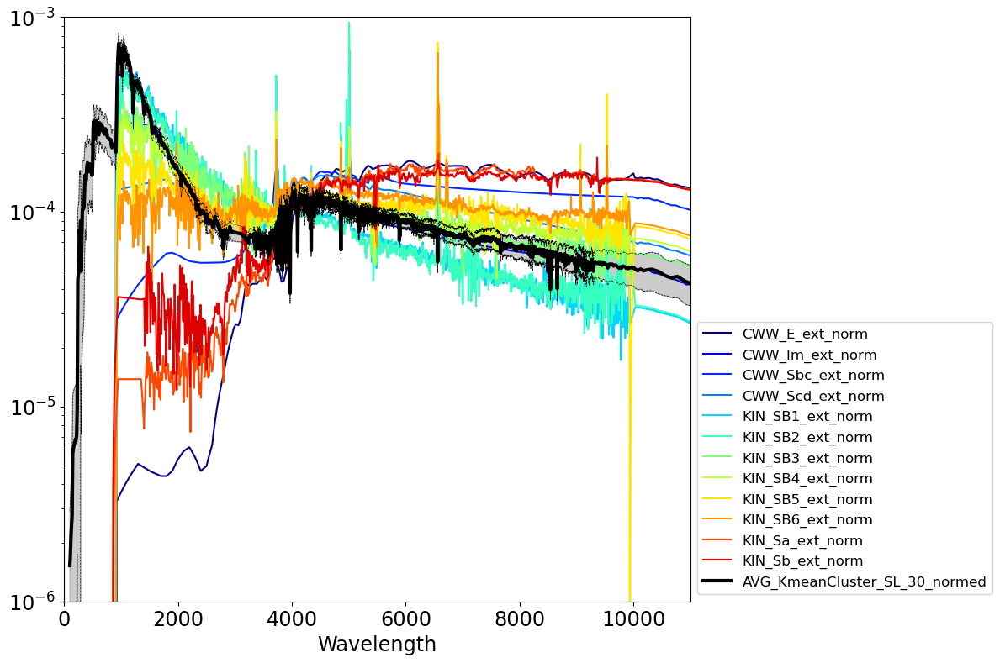

In [19]:
_figs_plot = []
for key in df_avg_spec_normed.keys()[1:]:
    if 'AVG' in key:
        _list = key.split('_')[1:]
        _list.insert(0, 'SIG')
        _sig_key = '_'.join(_list)
        fig, ax = plt.subplots(1,1)
        df_cww_spec_normed.plot('Wavelength', sorted(df_cww_spec_normed.keys()[1:]), ax=ax, color=all_colors_refs, legend=False)
        df_avg_spec_normed.plot('Wavelength', key, ax=ax, legend=False, color='k', linewidth=3)
        ax.plot(df_avg_spec_normed['Wavelength'], df_avg_spec_normed[key]+df_avg_spec_normed[_sig_key],\
                color='k', ls='--', linewidth=.5)
        ax.plot(df_avg_spec_normed['Wavelength'], df_avg_spec_normed[key]-df_avg_spec_normed[_sig_key],\
                color='k', ls='--', linewidth=.5)
        ax.fill_between(df_avg_spec_normed['Wavelength'],\
                        df_avg_spec_normed[key]-df_avg_spec_normed[_sig_key],\
                        df_avg_spec_normed[key]+df_avg_spec_normed[_sig_key],\
                        color='k', alpha=.2)
        ax.set_xlim(0, 11000)
        ax.set_ylim(1.0e-6, 1.0e-3)
        ax.set_yscale('log')
        ax.legend(loc='lower left', bbox_to_anchor=(1.,0.))
        fig.set_tight_layout(True)
        _figs_plot.append(fig)

In [20]:
if False:
    pdfoutputfilename = "KmeanClusAvgSEDs_vs_CWW-minNorm1000.pdf"
    SaveImageInPdf(_figs_plot,pdfoutputfilename)

## Compute distance between fors2-derived spectra and refs

In [21]:
key_test = sorted(df_avg_spec_normed.keys()[1:])[0]
dist_arr_test = [ dist_spec(df_avg_spec_normed[key_test], df_cww_spec_normed[key_ref],\
                           lambdas=np.array(df_avg_spec_normed['Wavelength'])\
                          ) for key_ref in sorted(df_cww_spec_normed.keys()[1:]) ]

In [22]:
closest = np.array(sorted(df_cww_spec_normed.keys()[1:]))[ np.where(dist_arr_test == np.min(dist_arr_test))[0]][0]
closest

'CWW_Scd_ext_norm'

In [23]:
refs_arr = np.array(sorted(df_cww_spec_normed.keys()[1:]))
templates_arr = np.array(list(clus_dict.keys()))
print(templates_arr)
distances_to_ref = np.empty_like([])
closest_refs = np.empty_like([])
df_refs_dist = pd.DataFrame(index=templates_arr)
df_refs_dist['N_FORS2'] = [len(clus_dict[key]) for key in clus_dict]
df_refs_dist['Template_label'] = [f'AVG_{key}_normed' for key in clus_dict]
df_refs_dist['avg_z'] = avg_zs
df_refs_dist['sigma_z'] = sigma_zs
for key in df_refs_dist.index:
    _dist_arr = [ dist_spec(df_avg_spec_normed[df_refs_dist.loc[key, 'Template_label']],\
                            df_cww_spec_normed[key_ref],\
                            lambdas=np.array(df_cww_spec_normed['Wavelength']),\
                            KL_div=True\
                           ) for key_ref in refs_arr ]
    _labels = [f"dist_to_{ref.split('_')[0]+'_'+ref.split('_')[1]}" for ref in refs_arr]
    df_refs_dist.loc[key, _labels] = _dist_arr
    _min_dist = np.min(_dist_arr)
    _sel_min = np.where(_dist_arr == _min_dist)[0]
    distances_to_ref = np.append(distances_to_ref, _min_dist)
    closest_refs = np.append(closest_refs, refs_arr[_sel_min])
df_refs_dist['Nearest_SED'] = closest_refs
df_refs_dist['Distance_to_nearest'] = distances_to_ref
df_refs_dist

['KmeanCluster_SL_1' 'KmeanCluster_SL_2' 'KmeanCluster_SL_3'
 'KmeanCluster_SL_4' 'KmeanCluster_SL_5' 'KmeanCluster_SL_6'
 'KmeanCluster_SL_7' 'KmeanCluster_SL_8' 'KmeanCluster_SL_9'
 'KmeanCluster_SL_10' 'KmeanCluster_SL_11' 'KmeanCluster_SL_12'
 'KmeanCluster_SL_13' 'KmeanCluster_SL_14' 'KmeanCluster_SL_15'
 'KmeanCluster_SL_16' 'KmeanCluster_SL_17' 'KmeanCluster_SL_18'
 'KmeanCluster_SL_19' 'KmeanCluster_SL_20' 'KmeanCluster_SL_21'
 'KmeanCluster_SL_22' 'KmeanCluster_SL_23' 'KmeanCluster_SL_24'
 'KmeanCluster_SL_25' 'KmeanCluster_SL_26' 'KmeanCluster_SL_27'
 'KmeanCluster_SL_28' 'KmeanCluster_SL_29' 'KmeanCluster_SL_30']


,N_FORS2,Template_label,avg_z,sigma_z,dist_to_CWW_E,dist_to_CWW_Im,dist_to_CWW_Sbc,dist_to_CWW_Scd,dist_to_KIN_SB1,dist_to_KIN_SB2,dist_to_KIN_SB3,dist_to_KIN_SB4,dist_to_KIN_SB5,dist_to_KIN_SB6,dist_to_KIN_Sa,dist_to_KIN_Sb,Nearest_SED,Distance_to_nearest
KmeanCluster_SL_1,24,AVG_KmeanCluster_SL_1_normed,0.459943,0.193520,1.342748,0.044902,0.445032,0.128343,0.087338,0.089219,0.041137,0.041960,inf,0.179568,0.906185,0.596423,KIN_SB3_ext_norm,0.041137
KmeanCluster_SL_2,43,AVG_KmeanCluster_SL_2_normed,0.433821,0.208233,0.021110,0.517978,0.054784,0.219206,0.784271,0.758065,0.440571,0.375733,inf,0.191108,0.012093,0.027935,KIN_Sa_ext_norm,0.012093
KmeanCluster_SL_3,7,AVG_KmeanCluster_SL_3_normed,0.281109,0.094681,3.375689,0.386294,1.632043,0.833992,0.200403,0.231445,0.442807,0.500900,inf,0.971579,2.533525,1.898038,KIN_SB1_ext_norm,0.200403
KmeanCluster_SL_4,28,AVG_KmeanCluster_SL_4_normed,0.397163,0.192790,2.005056,0.079405,0.785436,0.296504,0.040479,0.053430,0.101783,0.125639,inf,0.378478,1.420823,0.996830,KIN_SB1_ext_norm,0.040479
KmeanCluster_SL_5,14,AVG_KmeanCluster_SL_5_normed,0.689277,0.163060,0.658233,0.096491,0.120301,0.016693,0.239074,0.234320,0.086657,0.067783,inf,0.040540,0.416659,0.274405,CWW_Scd_ext_norm,0.016693
KmeanCluster_SL_6,3,AVG_KmeanCluster_SL_6_normed,0.454940,0.080432,0.240554,0.417954,0.107128,0.191880,0.652008,0.622104,0.335986,0.275350,inf,0.163586,0.132454,0.066146,KIN_Sb_ext_norm,0.066146
KmeanCluster_SL_7,14,AVG_KmeanCluster_SL_7_normed,0.429957,0.268671,2.248673,0.134560,0.947452,0.393906,0.063903,0.081209,0.160804,0.189323,inf,0.489975,1.617825,1.151378,KIN_SB1_ext_norm,0.063903
KmeanCluster_SL_8,7,AVG_KmeanCluster_SL_8_normed,0.479153,0.234013,0.991992,0.126022,0.327892,0.120391,0.219785,0.212567,0.094694,0.075535,inf,0.150367,0.648256,0.401968,KIN_SB4_ext_norm,0.075535
KmeanCluster_SL_9,11,AVG_KmeanCluster_SL_9_normed,0.639795,0.211380,3.134943,0.291711,1.438644,0.704005,0.138203,0.165600,0.352132,0.411300,inf,0.825560,2.333868,1.746110,KIN_SB1_ext_norm,0.138203
KmeanCluster_SL_10,20,AVG_KmeanCluster_SL_10_normed,0.582317,0.165739,0.394897,0.169171,0.047260,0.022167,0.347088,0.334225,0.129527,0.093714,inf,0.028260,0.220908,0.117301,CWW_Scd_ext_norm,0.022167


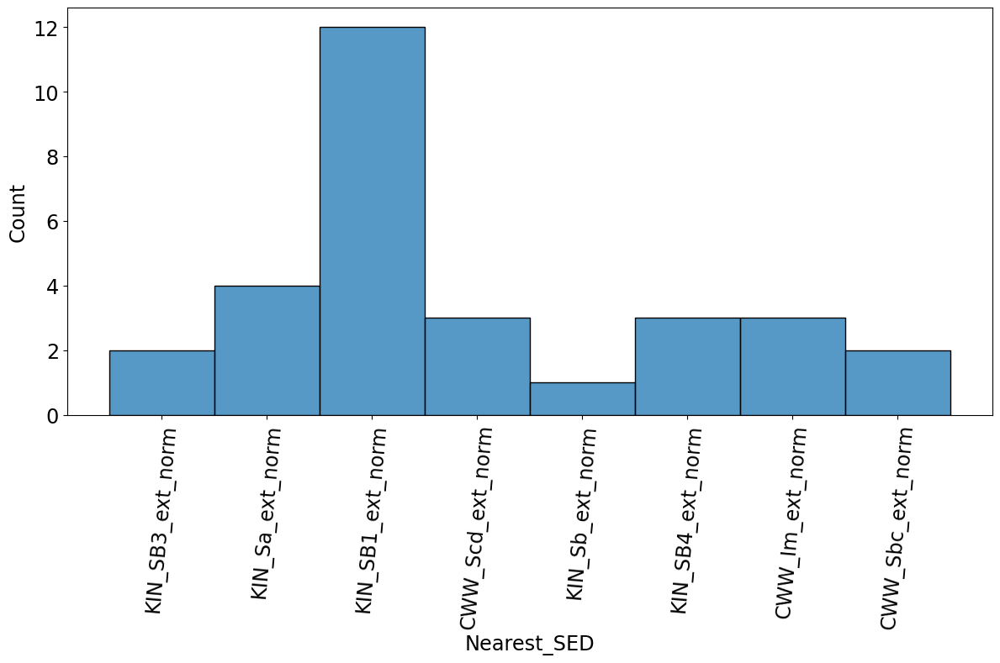

In [24]:
f,a = plt.subplots(1,1)
sns.histplot(data=df_refs_dist, x='Nearest_SED', ax=a)
a.tick_params(axis='x', rotation=85)
f.set_tight_layout(True)
all_figs = [f]

In [25]:
for key in df_refs_dist.index:
    nearest_SED = df_refs_dist.loc[key, 'Nearest_SED']
    _lambdas = np.array(df_cww_spec_normed['Wavelength'])
    _dists_to_nearest = np.empty_like([])
    for spec_id in clus_dict[key]:
        _spec_path = os.path.join(path_BC, f'SPEC{spec_id}_HZ4_BC.txt')
        _spec_arr = np.loadtxt(_spec_path)
        _spec_fonc = interp1d(_spec_arr[:-1, 0], _spec_arr[:-1, 1], bounds_error=False, fill_value=0.)
        _lumins = _spec_fonc(_lambdas)
        _mask = (_lambdas >= 1000.)*(_lambdas <= 10000.)
        _norm = np.trapz(_lumins[_mask], _lambdas[_mask])
        normed_spec = _lumins/_norm
        _dists_to_nearest = np.append(_dists_to_nearest,\
                                      dist_spec(normed_spec, df_cww_spec_normed[nearest_SED], lambdas=_lambdas,\
                                                KL_div=True)\
                                     )
    _avg_dist_to_nearest = np.mean(_dists_to_nearest)
    _sigma_dist_to_nearest = np.std(_dists_to_nearest)
    df_refs_dist.loc[key, 'Avg_dist_to_nearest_SED'] = _avg_dist_to_nearest
    df_refs_dist.loc[key, 'Sigma_nearest_SED'] = _sigma_dist_to_nearest
    #print(key, new_clus_dict[key])
    #df_refs_dist.loc[key, 'Constituants_Dict'] = new_clus_dict[key]
df_refs_dist

,N_FORS2,Template_label,avg_z,sigma_z,dist_to_CWW_E,dist_to_CWW_Im,dist_to_CWW_Sbc,dist_to_CWW_Scd,dist_to_KIN_SB1,dist_to_KIN_SB2,dist_to_KIN_SB3,dist_to_KIN_SB4,dist_to_KIN_SB5,dist_to_KIN_SB6,dist_to_KIN_Sa,dist_to_KIN_Sb,Nearest_SED,Distance_to_nearest,Avg_dist_to_nearest_SED,Sigma_nearest_SED
KmeanCluster_SL_1,24,AVG_KmeanCluster_SL_1_normed,0.459943,0.193520,1.342748,0.044902,0.445032,0.128343,0.087338,0.089219,0.041137,0.041960,inf,0.179568,0.906185,0.596423,KIN_SB3_ext_norm,0.041137,0.045750,0.010108
KmeanCluster_SL_2,43,AVG_KmeanCluster_SL_2_normed,0.433821,0.208233,0.021110,0.517978,0.054784,0.219206,0.784271,0.758065,0.440571,0.375733,inf,0.191108,0.012093,0.027935,KIN_Sa_ext_norm,0.012093,0.018925,0.007096
KmeanCluster_SL_3,7,AVG_KmeanCluster_SL_3_normed,0.281109,0.094681,3.375689,0.386294,1.632043,0.833992,0.200403,0.231445,0.442807,0.500900,inf,0.971579,2.533525,1.898038,KIN_SB1_ext_norm,0.200403,0.213451,0.080521
KmeanCluster_SL_4,28,AVG_KmeanCluster_SL_4_normed,0.397163,0.192790,2.005056,0.079405,0.785436,0.296504,0.040479,0.053430,0.101783,0.125639,inf,0.378478,1.420823,0.996830,KIN_SB1_ext_norm,0.040479,0.045148,0.014023
KmeanCluster_SL_5,14,AVG_KmeanCluster_SL_5_normed,0.689277,0.163060,0.658233,0.096491,0.120301,0.016693,0.239074,0.234320,0.086657,0.067783,inf,0.040540,0.416659,0.274405,CWW_Scd_ext_norm,0.016693,0.026038,0.015327
KmeanCluster_SL_6,3,AVG_KmeanCluster_SL_6_normed,0.454940,0.080432,0.240554,0.417954,0.107128,0.191880,0.652008,0.622104,0.335986,0.275350,inf,0.163586,0.132454,0.066146,KIN_Sb_ext_norm,0.066146,0.070236,0.001903
KmeanCluster_SL_7,14,AVG_KmeanCluster_SL_7_normed,0.429957,0.268671,2.248673,0.134560,0.947452,0.393906,0.063903,0.081209,0.160804,0.189323,inf,0.489975,1.617825,1.151378,KIN_SB1_ext_norm,0.063903,0.069852,0.014740
KmeanCluster_SL_8,7,AVG_KmeanCluster_SL_8_normed,0.479153,0.234013,0.991992,0.126022,0.327892,0.120391,0.219785,0.212567,0.094694,0.075535,inf,0.150367,0.648256,0.401968,KIN_SB4_ext_norm,0.075535,0.088074,0.041770
KmeanCluster_SL_9,11,AVG_KmeanCluster_SL_9_normed,0.639795,0.211380,3.134943,0.291711,1.438644,0.704005,0.138203,0.165600,0.352132,0.411300,inf,0.825560,2.333868,1.746110,KIN_SB1_ext_norm,0.138203,0.145488,0.035739
KmeanCluster_SL_10,20,AVG_KmeanCluster_SL_10_normed,0.582317,0.165739,0.394897,0.169171,0.047260,0.022167,0.347088,0.334225,0.129527,0.093714,inf,0.028260,0.220908,0.117301,CWW_Scd_ext_norm,0.022167,0.031762,0.014795


-0.0006 1.5


/tmp/ipykernel_2422/3380615843.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, a = plt.subplots(1,1)


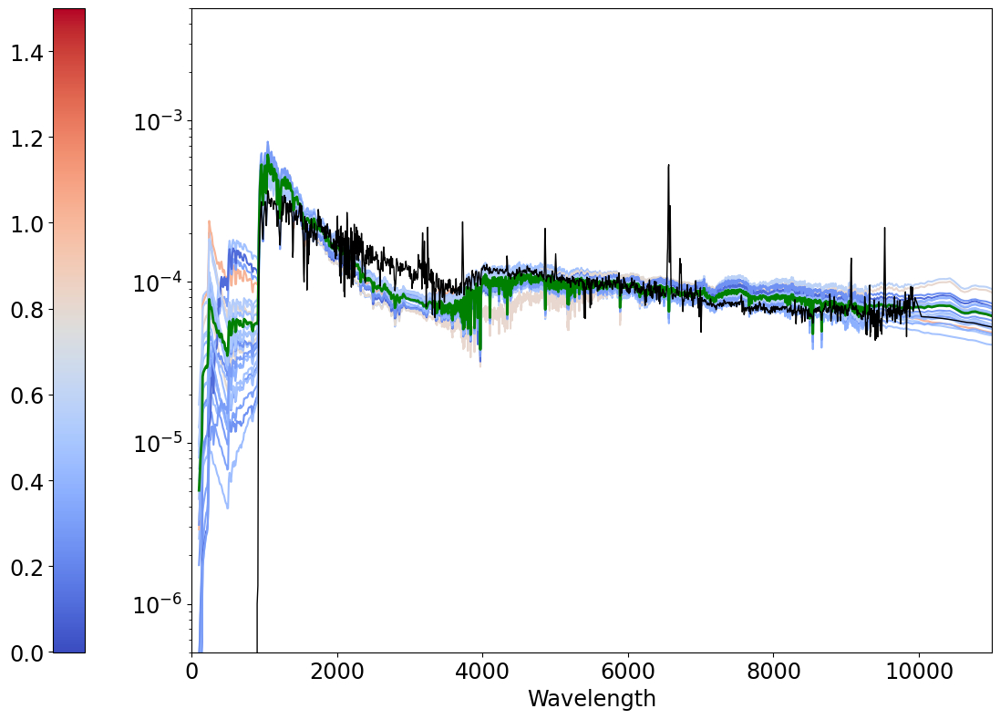

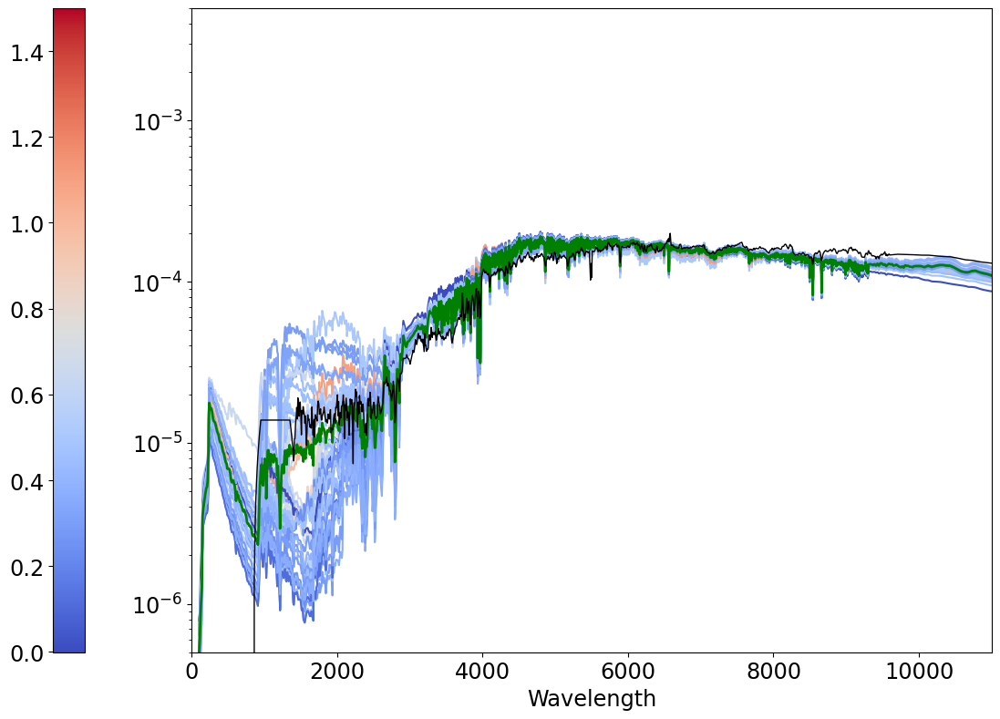

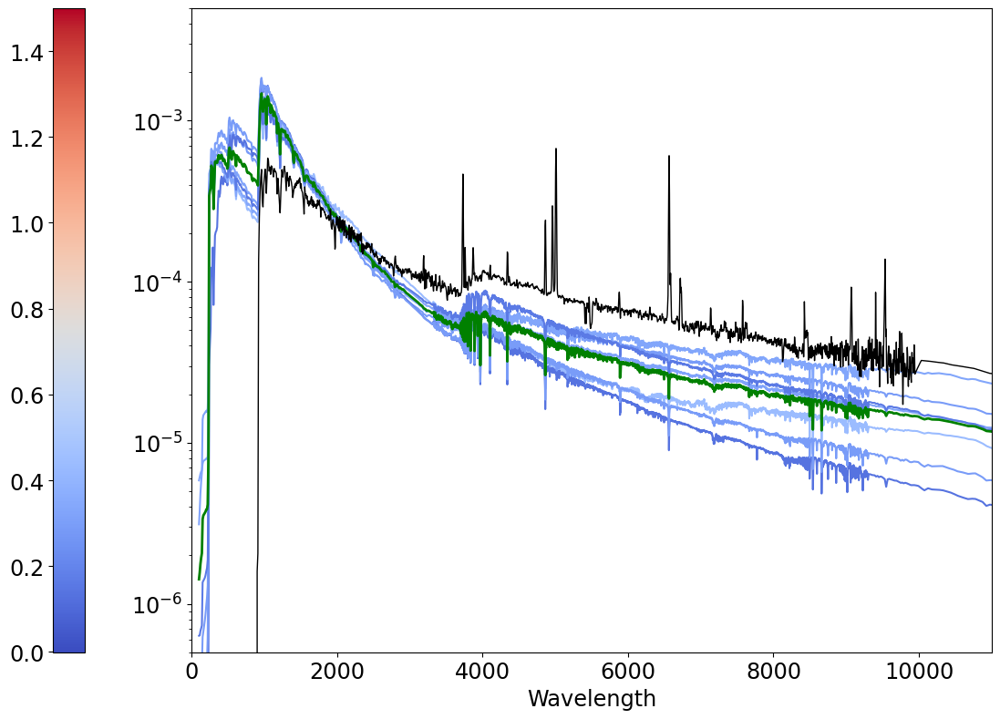

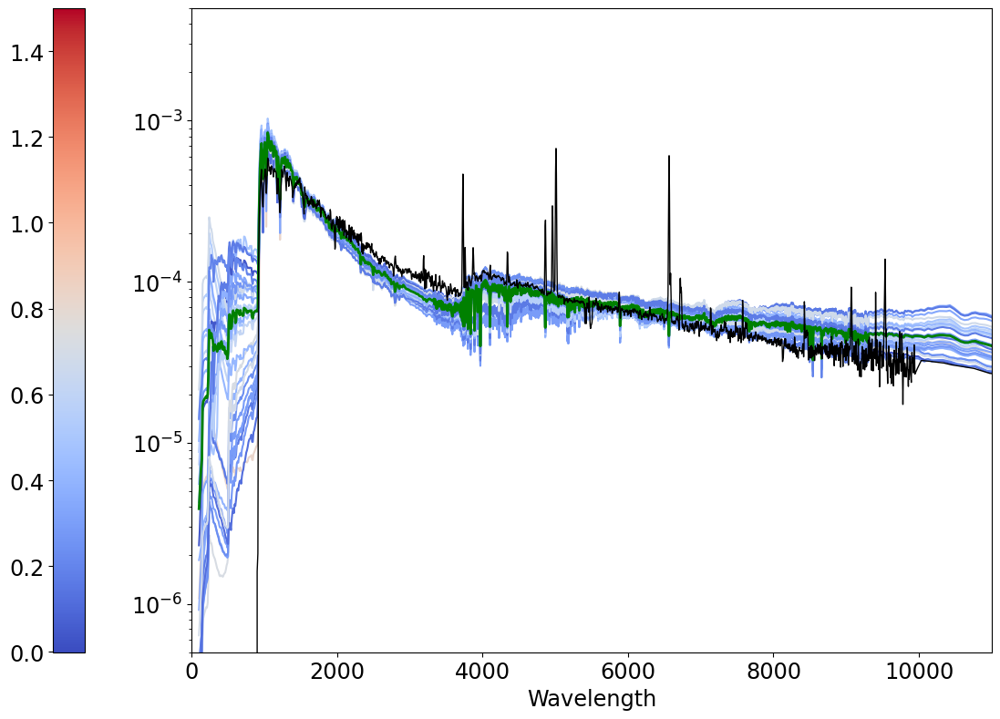

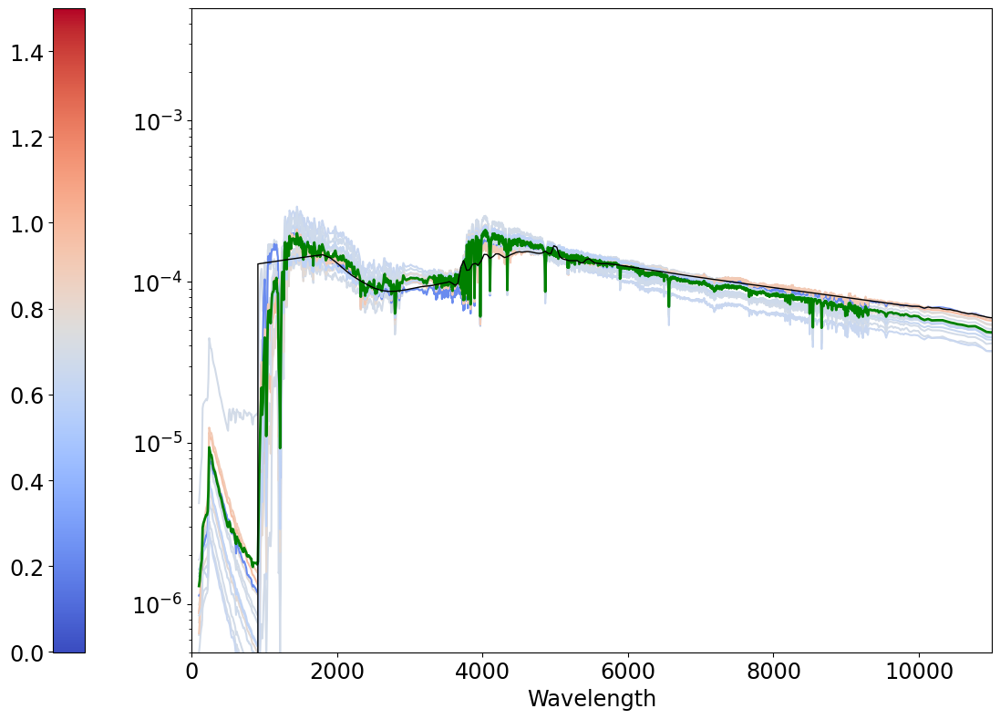

...

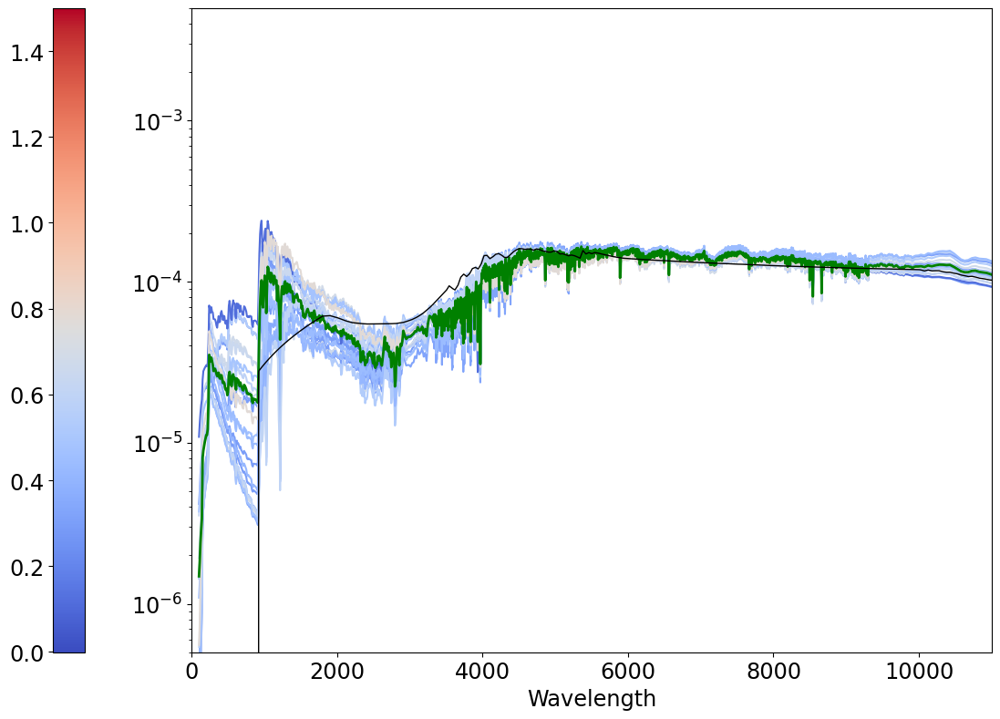

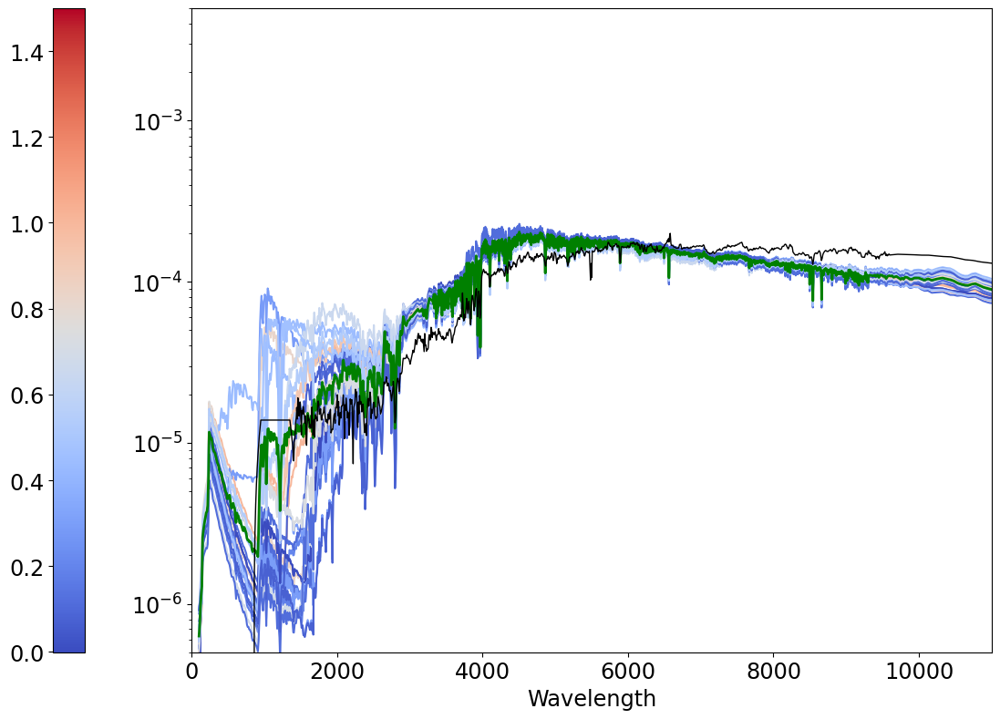

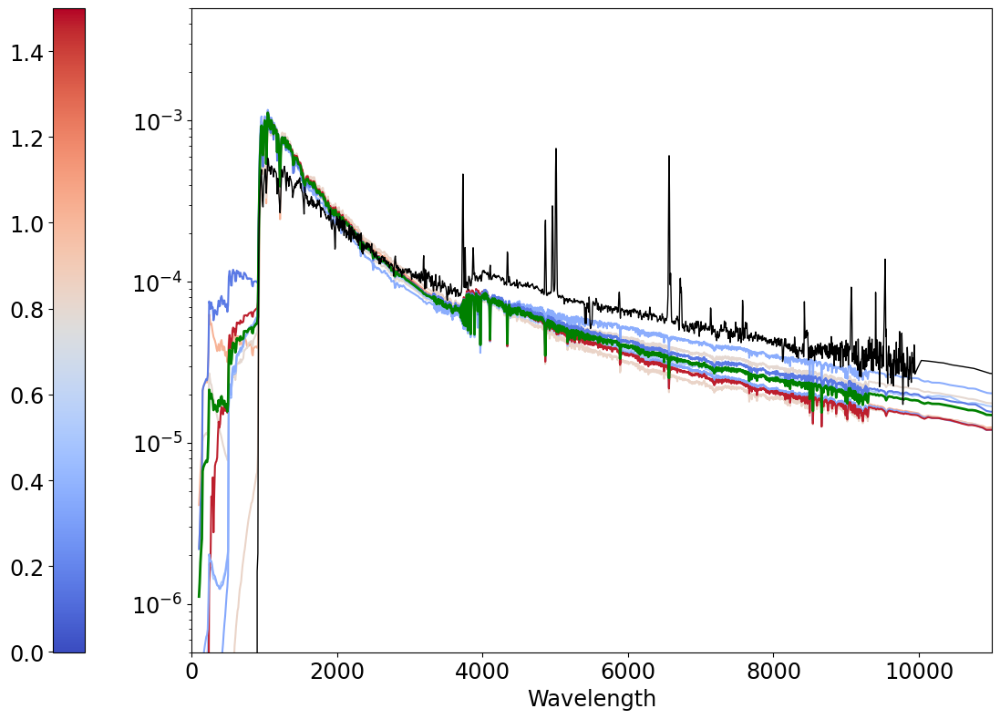

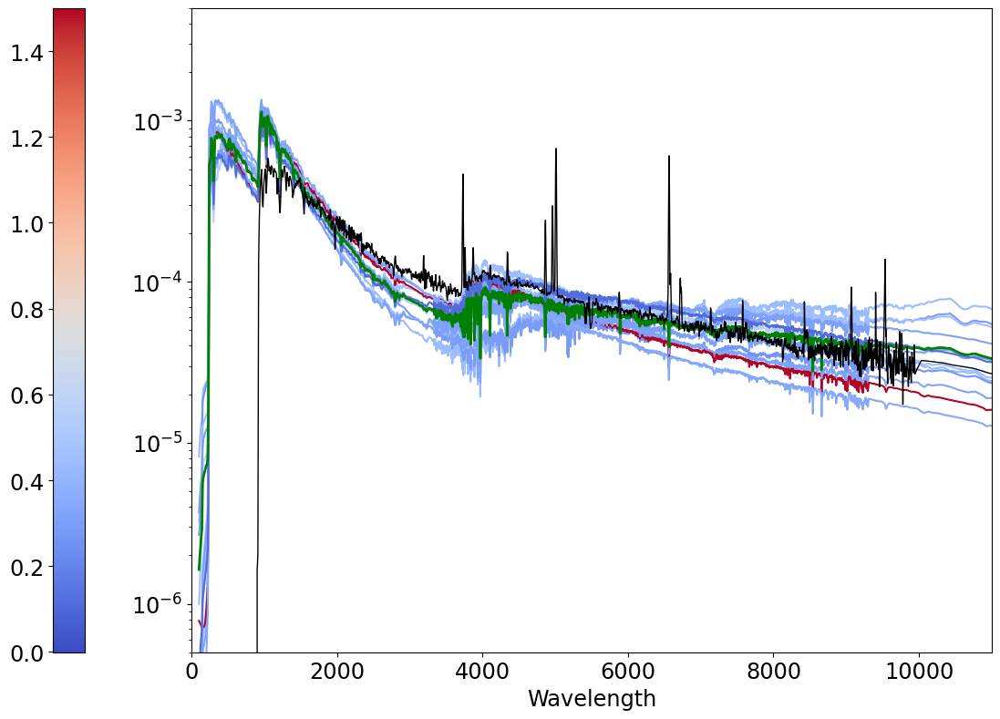

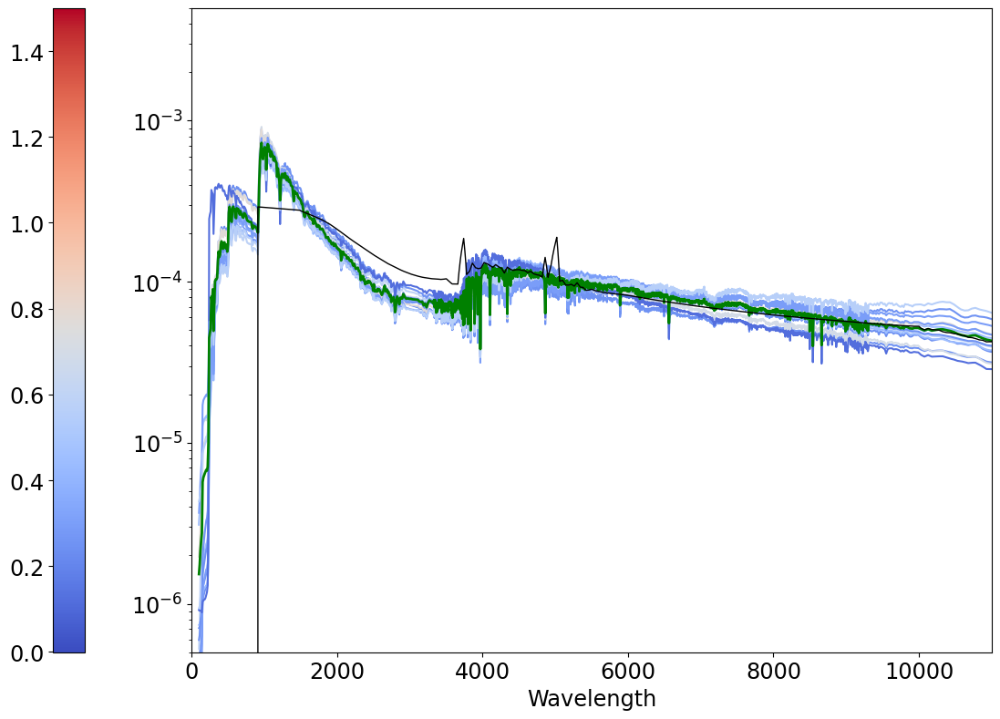

In [26]:
z_min, z_max = 1., 0.
for key in df_refs_dist.index:
    _dict = new_clus_dict[key]
    _redshifts = _dict['z_s']
    _z_min, _z_max = np.amin(_redshifts), np.amax(_redshifts)
    z_min, z_max = min(z_min, _z_min), max(z_max, _z_max)
    z_max = min(1.5, z_max)
print(z_min, z_max)

blu_red = plt.get_cmap('coolwarm')
cNorm = colors.Normalize(vmin=z_min, vmax=z_max)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=blu_red)

all_figs_fors2=[]
for key in df_refs_dist.index:
    f, a = plt.subplots(1,1)
    nearest_SED = df_refs_dist.loc[key, 'Nearest_SED']
    avg_spec = df_refs_dist.loc[key, 'Template_label']
    _lambdas = np.array(df_cww_spec_normed['Wavelength'])
    
    _dict = new_clus_dict[key]
    _df_cluster = pd.DataFrame()
    _df_cluster['Wavelength'] = _lambdas
    _redshifts = _dict['z_s']
    all_colors = scalarMap.to_rgba(_redshifts, alpha=1)
    for _fors2spec in _dict['ID']:
        _spec_path = os.path.join(path_BC, f'SPEC{_fors2spec}_HZ4_BC.txt')
        _spec_arr = np.loadtxt(_spec_path)
        _spec_fonc = interp1d(_spec_arr[:-1, 0], _spec_arr[:-1, 1], bounds_error=False, fill_value=0.)
        _lumins = _spec_fonc(_lambdas)
        _mask = (_lambdas >= 1000.)*(_lambdas <= 10000.)
        _norm = np.trapz(_lumins[_mask], _lambdas[_mask])
        normed_spec = _lumins/_norm
        _df_cluster[f'SPEC{_fors2spec}'] = normed_spec
    _listPlots = [f'SPEC{_fors2spec}' for _fors2spec in _dict['ID']]
    _df_cluster.plot('Wavelength', _listPlots, color=all_colors, ax=a, legend=False)
    
    
    df_avg_spec_normed.plot('Wavelength', avg_spec,\
                            color='green', linewidth=2,\
                            ax=a, legend=False)
    df_cww_spec_normed.plot('Wavelength', nearest_SED, ax=a, color='k', linewidth=1, legend=False)
    

    #a.legend(loc='lower left', bbox_to_anchor=(1., 0.))
    a.set_xlim(0., 11000.)
    a.set_ylim(5.0e-7, 5.0e-3)
    a.set_yscale('log')
    plt.colorbar(scalarMap, location='left', ax=a)
    f.set_tight_layout(True)
    all_figs_fors2.append(f)

In [27]:
if False:
    pdfoutputfilename = "FOR-SL_SEDs_vs_KmeanAvgAndCWW-KLdiv.pdf"
    SaveImageInPdf(all_figs_fors2,pdfoutputfilename)

## Plot each cluster's template vs. its nearest CWW/Kinney SED

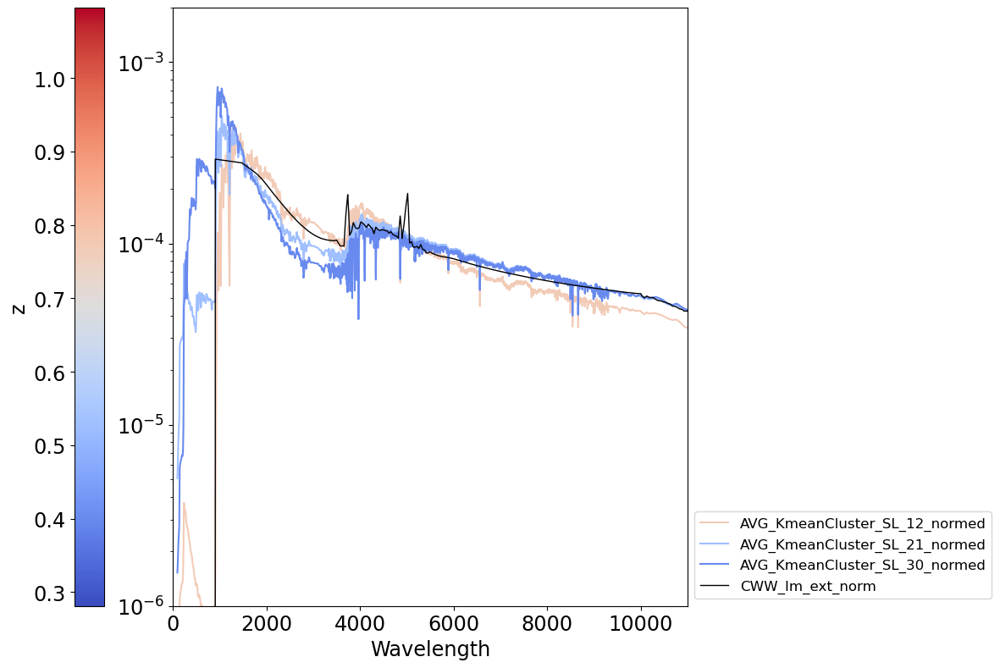

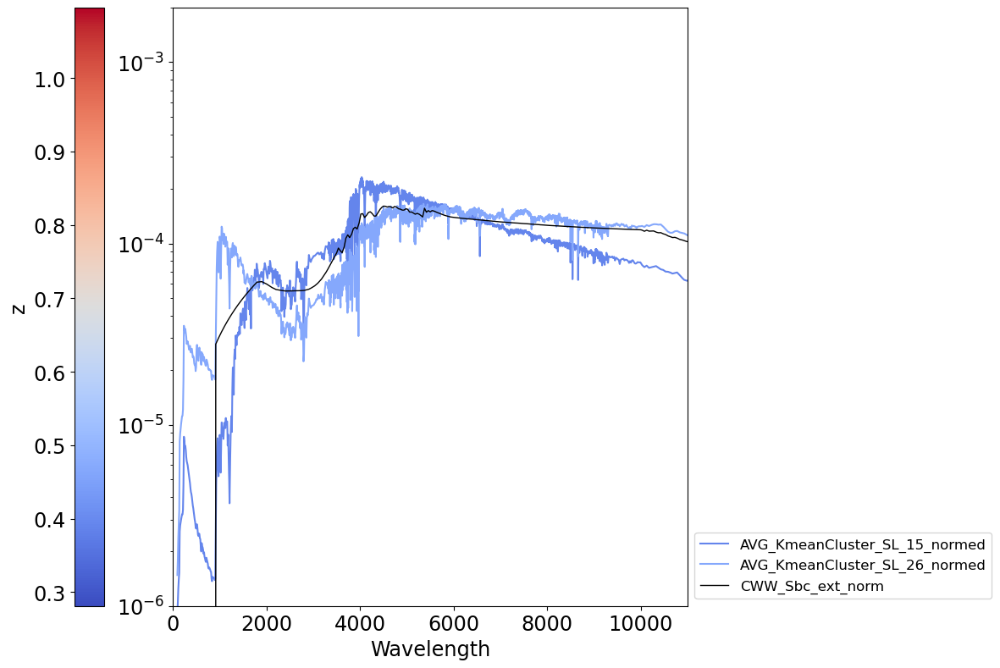

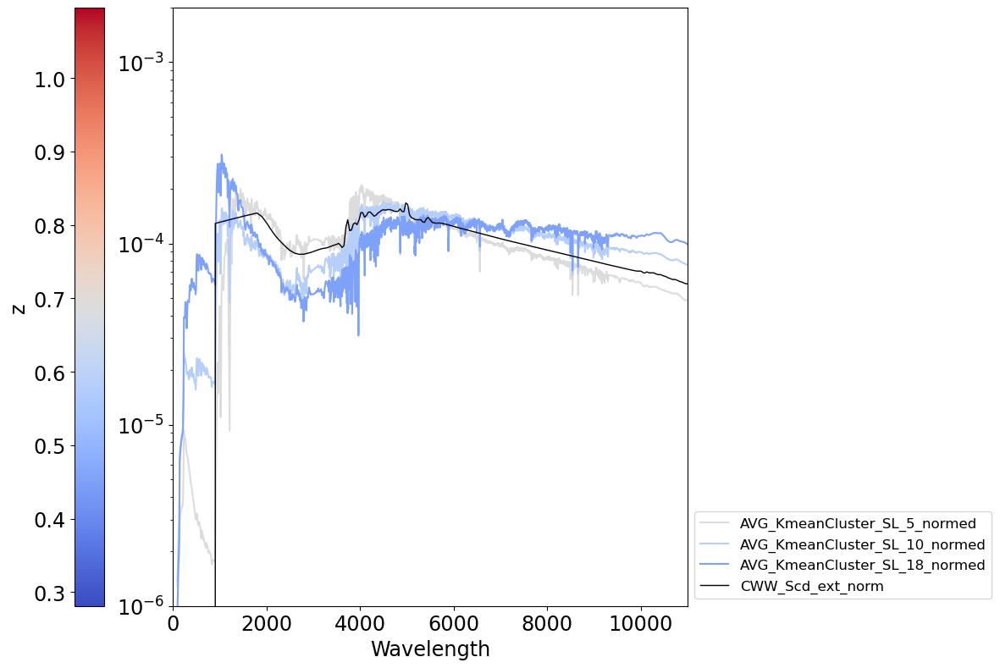

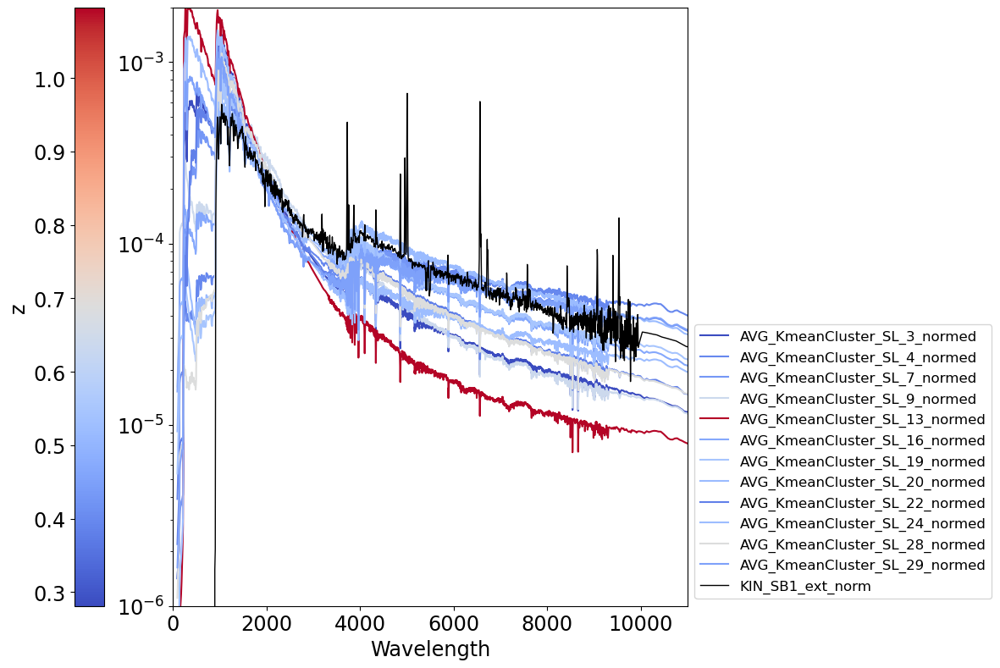

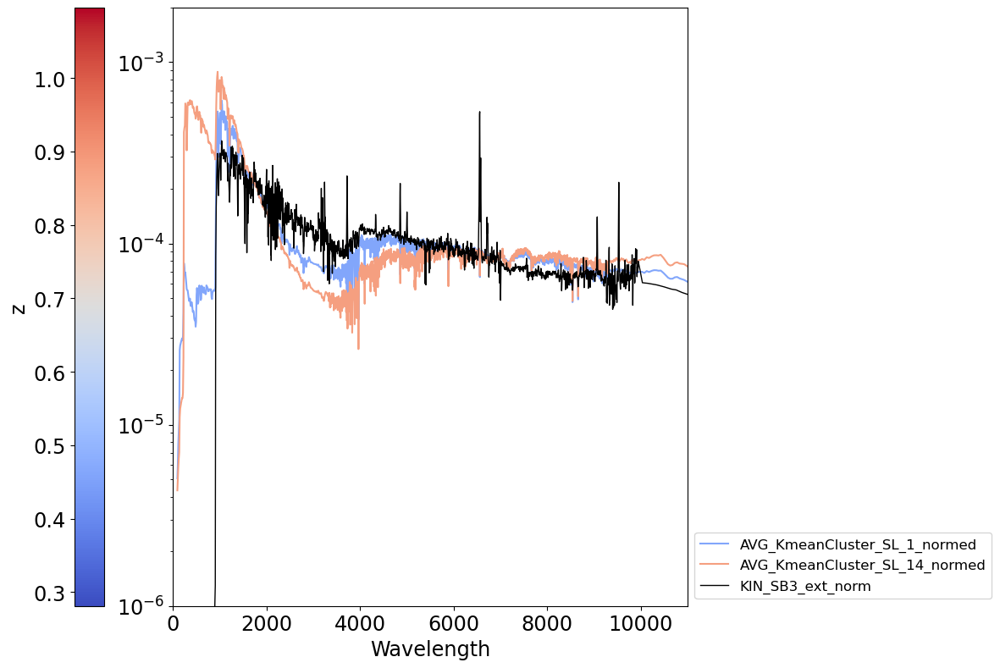

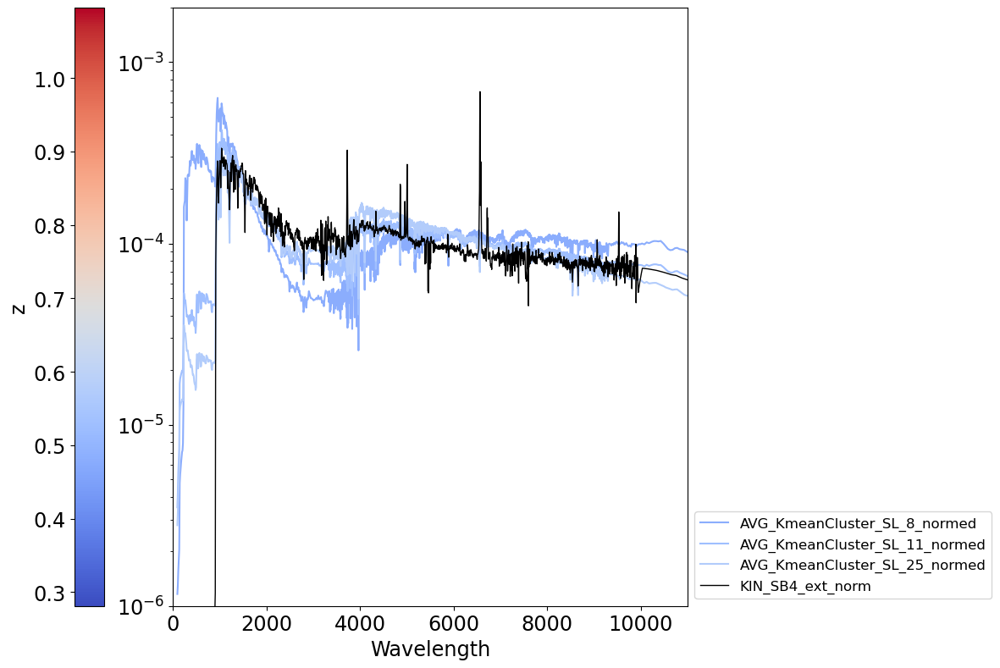

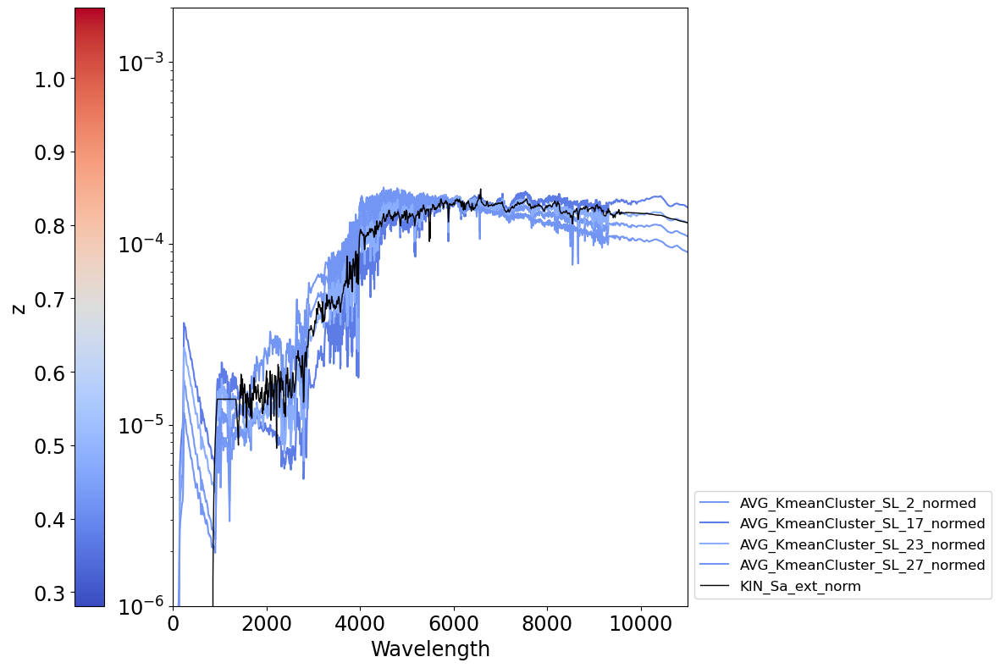

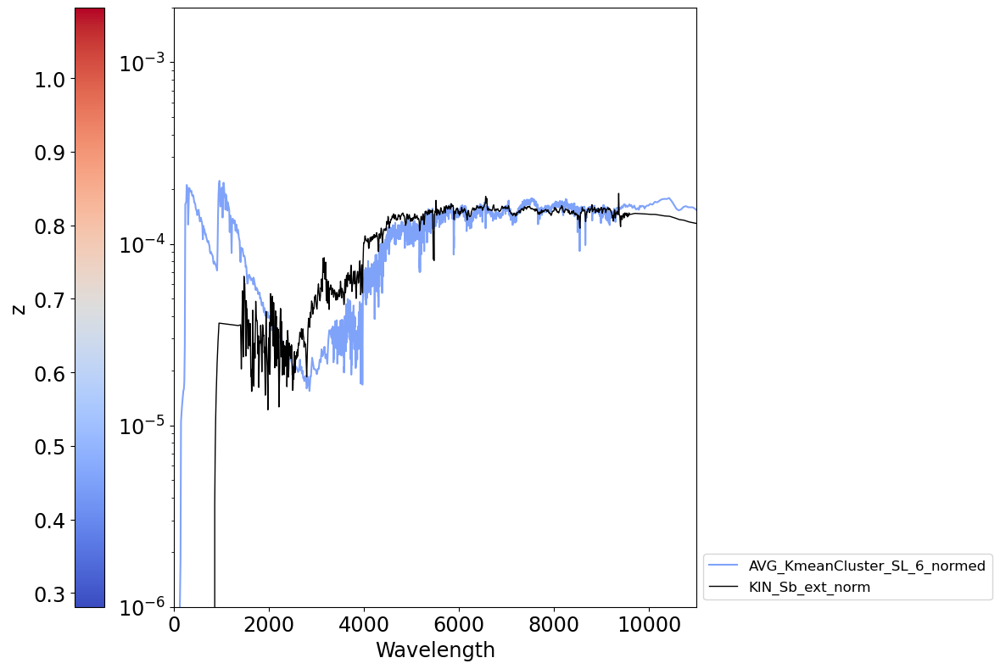

In [28]:
_zs = df_refs_dist['avg_z']
blu_red = plt.get_cmap('coolwarm')
cNorm = colors.Normalize(vmin=np.amin(_zs), vmax=np.amax(_zs))
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=blu_red)
for ref in sorted(df_cww_spec_normed.keys()[1:]):
    _sel = (df_refs_dist['Nearest_SED'] == ref)
    _list_clus = list(df_refs_dist['Template_label'][_sel])
    __zs = df_refs_dist['avg_z'][_sel]
    N_plots = len(_list_clus)
    if N_plots > 0:
        f, a = plt.subplots(1,1)
        all_colors = scalarMap.to_rgba(__zs, alpha=1)
        df_avg_spec_normed.plot('Wavelength', _list_clus, color=all_colors, ax=a, legend=False)
        df_cww_spec_normed.plot('Wavelength', ref, ax=a, color='k', linewidth=1, legend=False)
        a.set_yscale('log')
        a.set_xlim(0, 11000)
        a.set_ylim(1.0e-6, 2.0e-3)
        a.legend(loc='lower left', bbox_to_anchor=(1.,0.))
        plt.colorbar(scalarMap, ax=a, label='z', location='left')
        f.set_tight_layout(True)
        all_figs.append(f)

In [29]:
if False:
    pdfoutputfilename = "KmeanClus_SEDs_vs_nearest_CWW-KLdiv.pdf"
    SaveImageInPdf(all_figs,pdfoutputfilename)

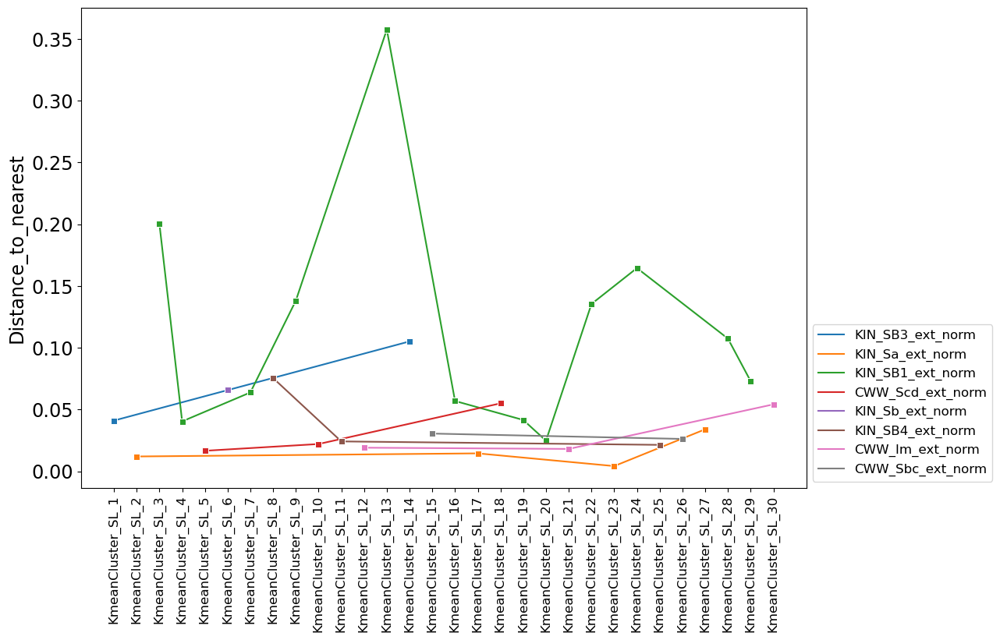

In [30]:
f,a = plt.subplots(1,1)
sns.lineplot(data=df_refs_dist, x=df_refs_dist.index, y='Distance_to_nearest',\
                hue='Nearest_SED',\
                ax=a,\
                marker='s'
               )
a.tick_params(axis='x', rotation=90, labelsize='large')
a.legend(loc='lower left', bbox_to_anchor=(1.,0.))

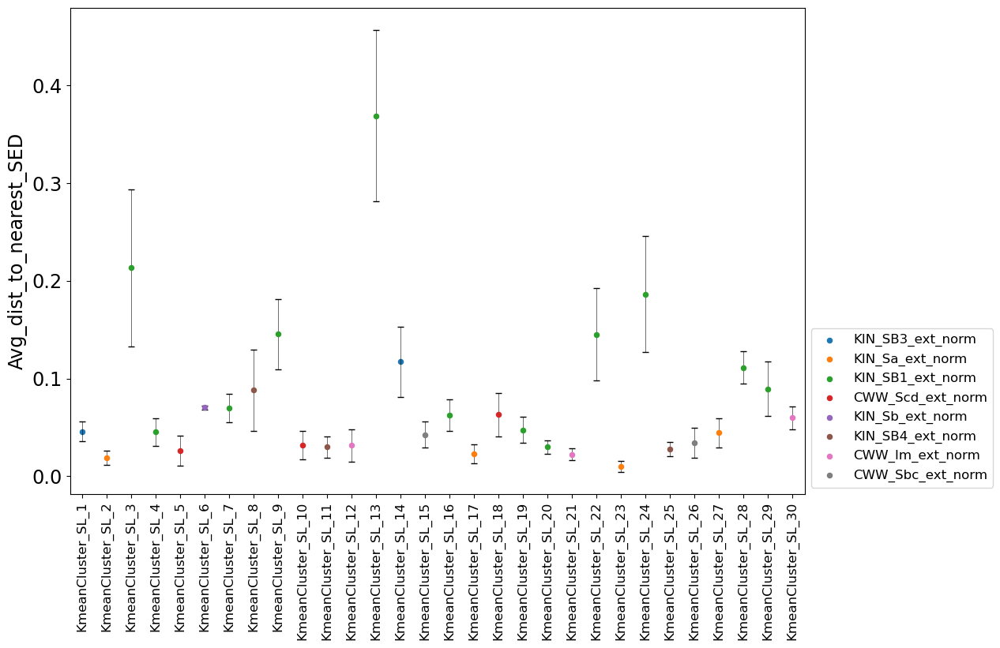

In [31]:
f,a = plt.subplots(1,1)
a.errorbar(x=np.arange(0,30), y=df_refs_dist['Avg_dist_to_nearest_SED'],\
           yerr=df_refs_dist['Sigma_nearest_SED'],\
           fmt='none',\
           elinewidth=0.4,\
           capsize=3,\
           ls='',\
           ecolor='k')
sns.pointplot(data=df_refs_dist, x=df_refs_dist.index, y='Avg_dist_to_nearest_SED', hue='Nearest_SED',\
              join=False,\
              ax=a, markers='.')
a.tick_params(axis='x', rotation=90, labelsize='large')
a.legend(loc='lower left', bbox_to_anchor=(1.,0.))

## Save relevant dataframes

In [32]:
if False:
    df_avg_spec_normed.to_pickle('df_KmeanClus_avgSpec.pkl')
    df_cww_spec_normed.to_pickle('df_CWW-Kin_spec.pkl')
    df_refs_dist.to_pickle('df_NearestCWW-Kin_neighbours.pkl')

In [33]:
if False:
    filepickle = './KmeanClustersFromSL_withZ.pkl'
    with open(filepickle, 'wb') as f:
        pickle.dump(new_clus_dict, f)

## Further analysis - spectral bands, spectra slope, color diagrams, etc.
TBD clustering:
étendre propriétés des spectres FORS2 avec ratio Lyman/Balmer, pente lambda > 5000, ratio énergie émise dans certaines bandes, emission lines
distance vs. Kinney-Calzetti : utiliser plutôt KL-divergence? utiliser des largeurs équivalentes de points identifiés ?
définir bandes U, B, V et voir si les galaxies se clusterisent selon des couleurs (U-B, B-V), rougissement, comment ça se compare vs. Kinney-Calzetti
Algo alternatif publi: 'Unsupervised classification of SDSS data' qui n'est pas en accord avec Kmean (Fisher-M algorithm?)

### Define broadbands for analysis

In [34]:
# mean WL (AA), full width at half maximum (AA), flux(lambda) for 0-magnitude (W/m²)
U_band_center, U_band_FWHM, U_band_f0 = 3650., 660., 3.981e-02
B_band_center, B_band_FWHM, B_band_f0 = 4450., 940., 6.310e-02
V_band_center, V_band_FWHM, V_band_f0 = 5510., 880., 3.631e-02
R_band_center, R_band_FWHM, R_band_f0 = 6580., 1380., 2.239e-02
I_band_center, I_band_FWHM, I_band_f0 = 8060., 1490., 1.148e-02

In [35]:
# FWHM = 2.sqrt(2.ln2).sigma for a normal distribution
U_band_sigma = U_band_FWHM/(2*np.sqrt(2*np.log(2)))
B_band_sigma = B_band_FWHM/(2*np.sqrt(2*np.log(2)))
V_band_sigma = V_band_FWHM/(2*np.sqrt(2*np.log(2)))
R_band_sigma = R_band_FWHM/(2*np.sqrt(2*np.log(2)))
I_band_sigma = I_band_FWHM/(2*np.sqrt(2*np.log(2)))

In [36]:
def gaussian_band(mu, sig, interp_step=1.):
    # Returns A FUNCTION that is created by 1D-interpolation of a normal distrib of mean mu and std dev sig
    # Interpolation range is defined arbitrarily as +/- 10sig
    # interpolation step is 1. (design case is we are working with angstrom units with a resolution of .1nm)
    _x = np.arange(mu-10*sig, mu+10*sig+interp_step, interp_step)
    _y = np.exp(-np.power(_x-mu, 2)/(2*np.power(sig, 2))) / (sig*np.power(2*np.pi, 0.5))
    _max = np.amax(_y)
    _y = _y/_max
    #_int = np.trapz(_y, _x)
    func = interp1d(_x, _y, bounds_error=False, fill_value=0.)
    return func

def rect_band(mu, width, interp_step=1.):
    # Returns A FUNCTION that is created by 1D-interpolation of a normal distrib of mean mu and std dev sig
    # Interpolation range is defined arbitrarily as +/- 10sig
    # interpolation step is 1. (design case is we are working with angstrom units with a resolution of .1nm)
    _x = np.arange(mu-width/2, mu+width/2+interp_step, interp_step)
    #_int = np.trapz(_y, _x)
    func = interp1d(_x, np.ones_like(_x), bounds_error=False, fill_value=0.)
    return func

670.0
950.0
890.0
1390.0
1490.0


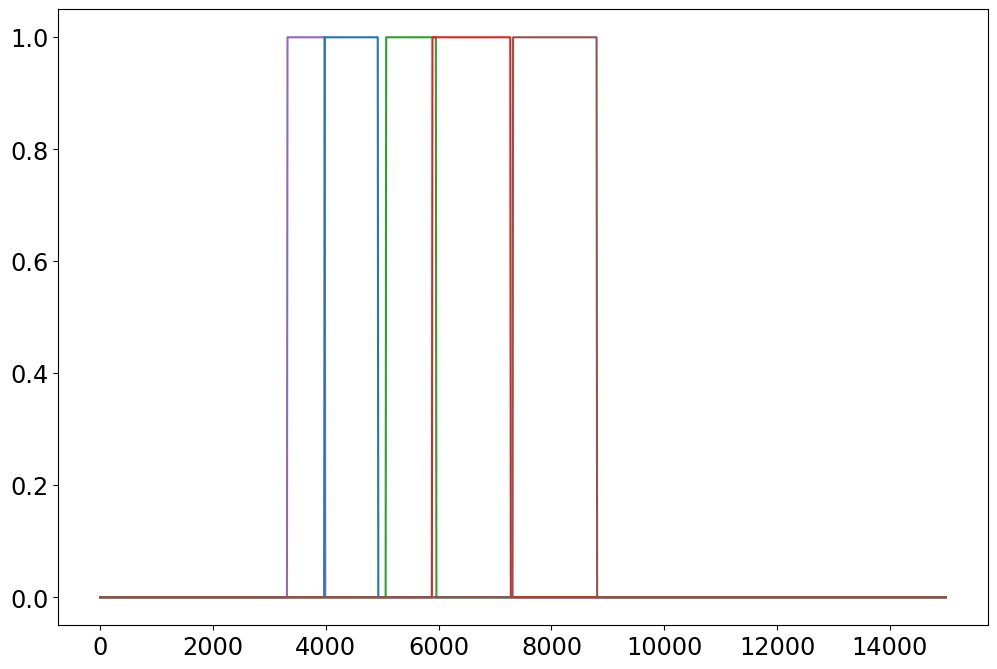

In [37]:
_wl = np.arange(0., 15000., 10)
for _mu, _sig, _f0, c in zip([U_band_center, B_band_center, V_band_center, R_band_center, I_band_center],\
                             [U_band_sigma, B_band_sigma, V_band_sigma, R_band_sigma, I_band_sigma],\
                             [U_band_f0, B_band_f0, V_band_f0, R_band_f0, I_band_f0],\
                             ['tab:purple', 'tab:blue', 'tab:green', 'tab:red', 'tab:brown']\
                            ):
    _band = rect_band(_mu, 2.355*_sig)
    _int = np.trapz(_band(_wl), _wl)
    plt.plot(_wl, _band(_wl), color=c)
    print(_int)

In [38]:
gauss_bands_dict = {\
                    "U":{"Mean": U_band_center,\
                         "Sigma": U_band_sigma,\
                         "f_0": U_band_f0\
                        },\
                    "B":{"Mean": B_band_center,\
                         "Sigma": B_band_sigma,\
                         "f_0": B_band_f0\
                        },\
                    "V":{"Mean": V_band_center,\
                         "Sigma": V_band_sigma,\
                         "f_0": V_band_f0\
                        },\
                    "R":{"Mean": R_band_center,\
                         "Sigma": R_band_sigma,\
                         "f_0": R_band_f0\
                        },\
                    "I":{"Mean": I_band_center,\
                         "Sigma": I_band_sigma,\
                         "f_0": I_band_f0\
                        }\
                   }

rect_bands_dict = {\
                   "U":{"Mean": U_band_center,\
                        "Width": U_band_FWHM,\
                        "f_0": U_band_f0\
                       },\
                   "B":{"Mean": B_band_center,\
                        "Width": B_band_FWHM,\
                        "f_0": B_band_f0\
                       },\
                   "V":{"Mean": V_band_center,\
                        "Width": V_band_FWHM,\
                        "f_0": V_band_f0\
                       },\
                   "R":{"Mean": R_band_center,\
                        "Width": R_band_FWHM,\
                        "f_0": R_band_f0\
                       },\
                   "I":{"Mean": I_band_center,\
                        "Width": I_band_FWHM,\
                        "f_0": I_band_f0\
                       }\
                  }

In [39]:
def flux_in_band(wavelengths, spectrum, band_name, band_shape="window"):
    from astropy import constants as const
    if band_shape == "gaussian":
        _band = gaussian_band(band_name["Mean"], band_name["Sigma"])
    else:
        band_shape = "window"
        _band = rect_band(band_name["Mean"], band_name["Width"])
    _transm = spectrum * _band(wavelengths) # * ( const.c.value / np.power(wavelengths, 2) ) if flux-density is in f_nu(lambda) 
    flux = np.trapz(_transm, wavelengths)/(4*np.pi*(3.0857e17)**2) # DL=10pcs for absolute magnitudes
    return flux

def mag_in_band(wavelengths, spectrum, band_name):
    _flux = flux_in_band(wavelengths, spectrum, band_name)
    _mag0 = -2.5*np.log10(band_name["f_0"])
    mag = -2.5*np.log10(_flux) - _mag0
    return mag

def color_index(wavelengths, spectrum, band_1, band_2):
    _mag1 = mag_in_band(wavelengths, spectrum, band_1)
    _mag2 = mag_in_band(wavelengths, spectrum, band_2)
    color = _mag1 - _mag2
    return color

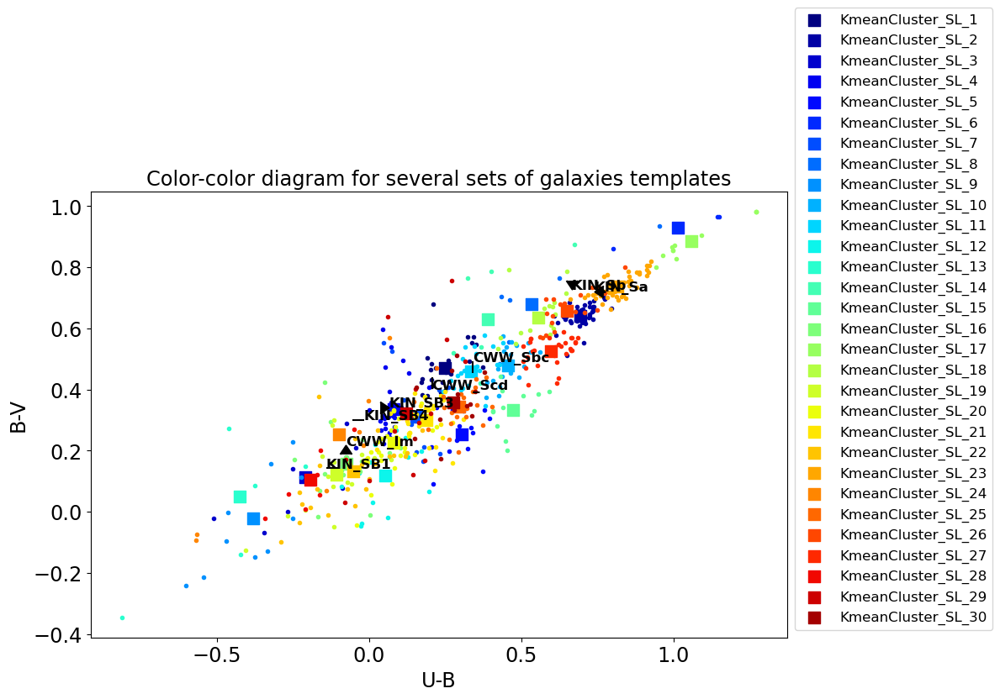

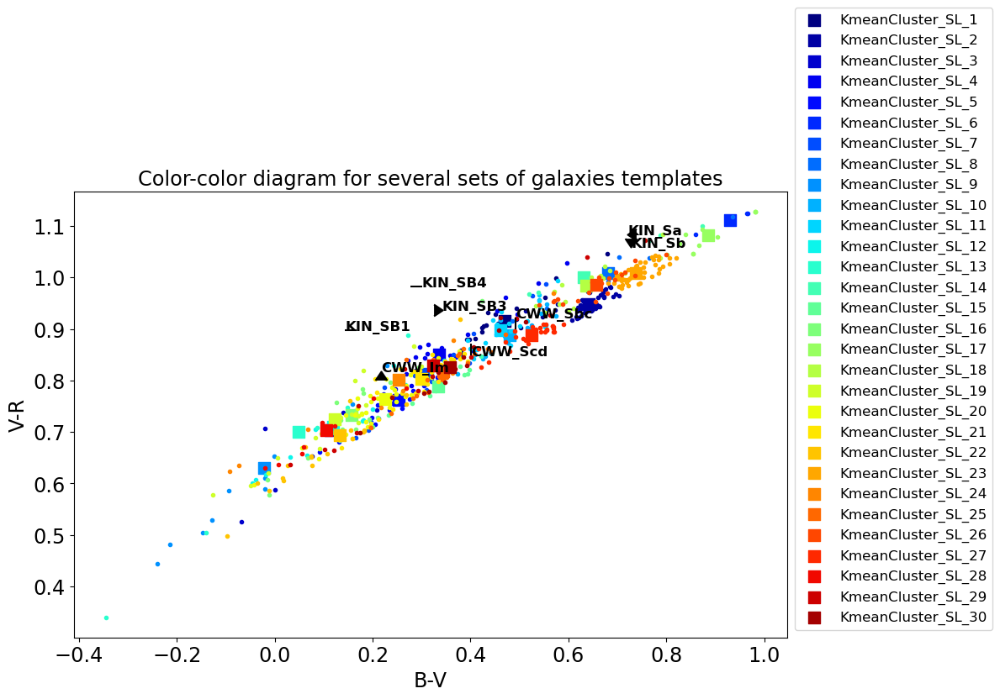

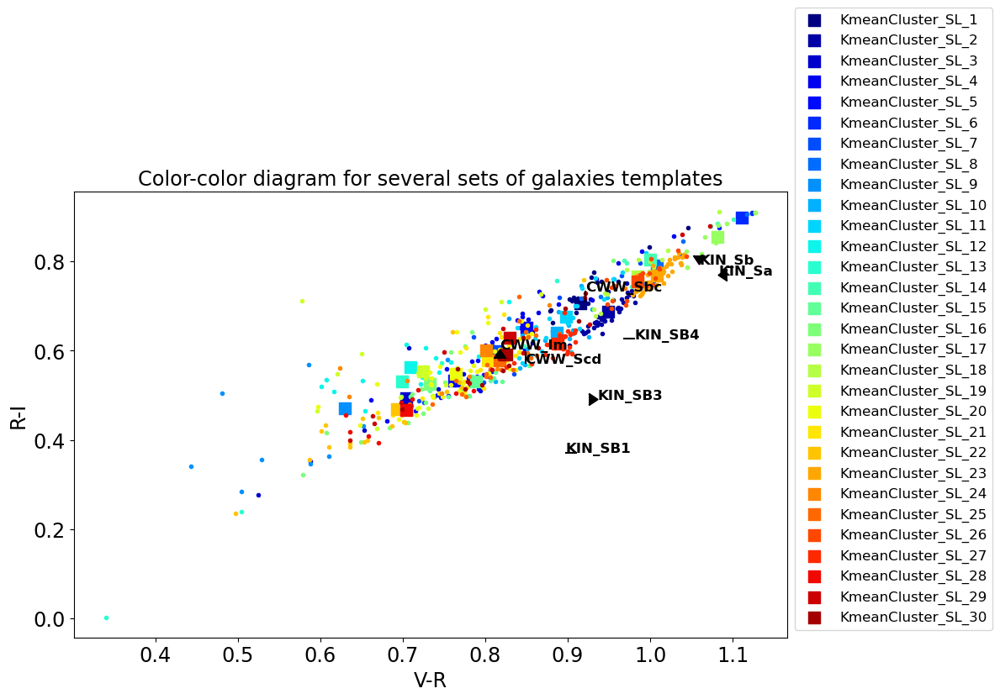

In [40]:
#z_min, z_max = 1., 0.
#for key in df_refs_dist.index:
#    _dict = new_clus_dict[key]
#    _redshifts = _dict['z_s']
#    _z_min, _z_max = np.amin(_redshifts), np.amax(_redshifts)
#    z_min, z_max = min(z_min, _z_min), max(z_max, _z_max)
#    z_max = min(1.5, z_max)
#print(z_min, z_max)
mag_list = ["U", "B", "V", "R", "I"]
for _c1, _c2, _c3 in zip(mag_list[:-2], mag_list[1:-1], mag_list[2:]):
    jet = plt.get_cmap('jet')
    jetNorm = colors.Normalize(vmin=0, vmax=len(list(df_refs_dist.index)))
    jetMap = cmx.ScalarMappable(norm=jetNorm, cmap=jet)

    all_jetCols = jetMap.to_rgba(np.arange(len(list(df_refs_dist.index))), alpha=1)

    f, a = plt.subplots(1,1)
    
    for key, col in zip(df_refs_dist.index, all_jetCols):
        nearest_SED = df_refs_dist.loc[key, 'Nearest_SED']
        avg_spec = df_refs_dist.loc[key, 'Template_label']

        _dict = new_clus_dict[key]
        _col1 = []
        _col2 = []
        for _fors2spec in _dict['ID']:
            _spec_path = os.path.join(path_BC, f'SPEC{_fors2spec}_HZ4_BC.txt')
            _spec_arr = np.loadtxt(_spec_path)
            _spec_fonc = interp1d(_spec_arr[:-1, 0], _spec_arr[:-1, 1], bounds_error=False, fill_value=0.)
            _lumins = _spec_fonc(lambdas)
            _norm = np.trapz(_lumins[mask], _lambdas[mask])
            normed_spec = _lumins/_norm
            col_UB = color_index(lambdas[mask], normed_spec[mask], rect_bands_dict[_c1], rect_bands_dict[_c2])
            col_BV = color_index(lambdas[mask], normed_spec[mask], rect_bands_dict[_c2], rect_bands_dict[_c3])
            _col1.append(col_UB)
            _col2.append(col_BV)


        a.scatter(_col1, _col2, color=col, marker='.')


        col_UB_avg = color_index(lambdas[mask], df_avg_spec_normed[avg_spec][mask], rect_bands_dict[_c1], rect_bands_dict[_c2])
        col_BV_avg = color_index(lambdas[mask], df_avg_spec_normed[avg_spec][mask], rect_bands_dict[_c2], rect_bands_dict[_c3])

        a.scatter(col_UB_avg, col_BV_avg, color=col, label=key, marker='s', s=100)

    for kin_sed, m in zip(set(df_refs_dist['Nearest_SED']), np.arange(len(set(df_refs_dist['Nearest_SED'])))):
        col_UB_cww = color_index(df_cww_spec_normed['Wavelength'][mask], df_cww_spec_normed[kin_sed][mask], rect_bands_dict[_c1], rect_bands_dict[_c2])
        col_BV_cww = color_index(df_cww_spec_normed['Wavelength'][mask], df_cww_spec_normed[kin_sed][mask], rect_bands_dict[_c2], rect_bands_dict[_c3])

        kin_name = "_".join(kin_sed.split('_')[:2])

        a.scatter(col_UB_cww, col_BV_cww, color='k', s=100, marker=m)
        a.annotate(kin_name, (col_UB_cww, col_BV_cww), fontsize=12, weight='bold')


    a.legend(loc='lower left', bbox_to_anchor=(1., 0.))

    a.set_xlabel(f"{_c1}-{_c2}")
    a.set_ylabel(f"{_c2}-{_c3}")
    a.set_title(f"Color-color diagram for several sets of galaxies templates")

    f.set_tight_layout(True)
    #all_figs_colors.append(f)

/tmp/ipykernel_2422/128978878.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, a = plt.subplots(1, 1)


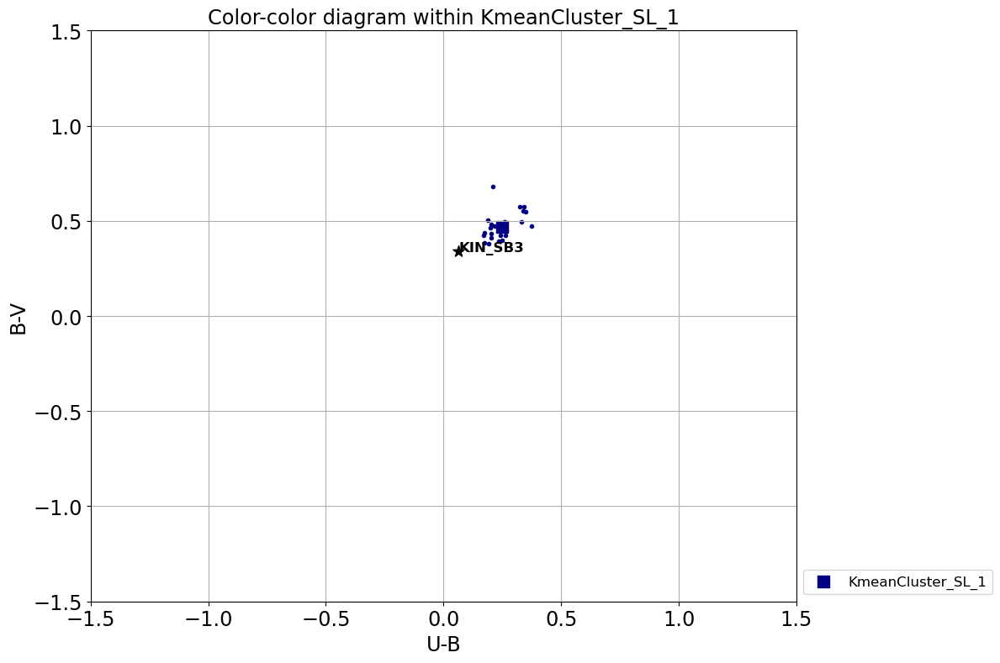

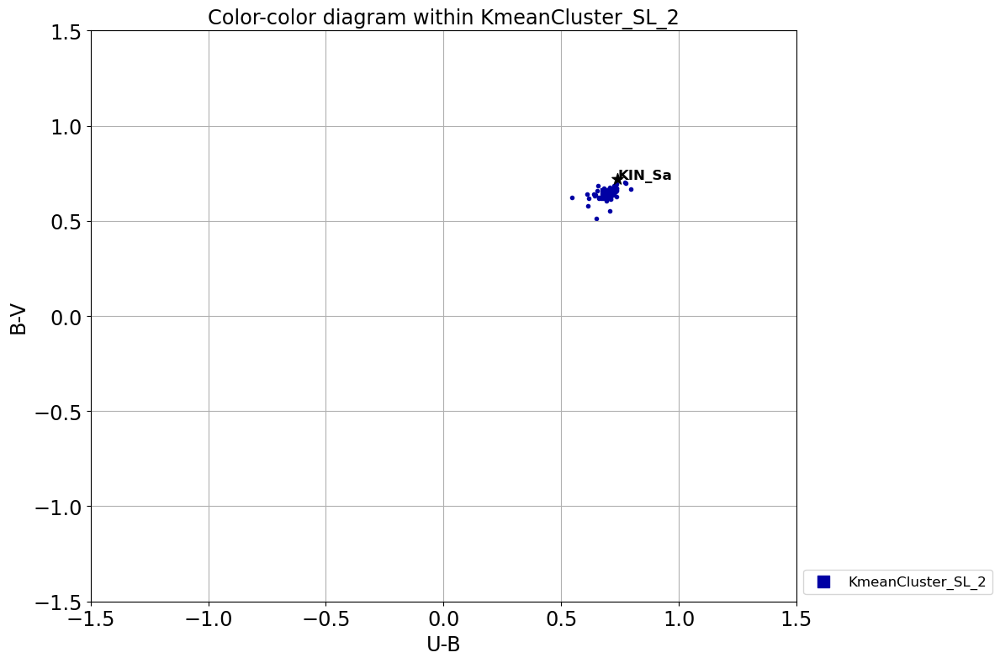

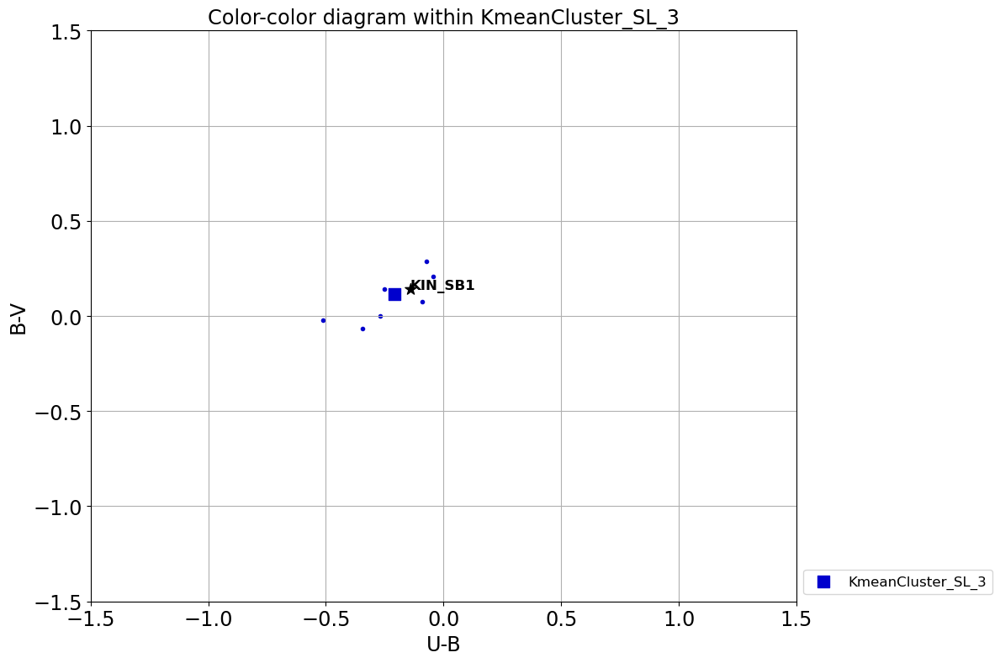

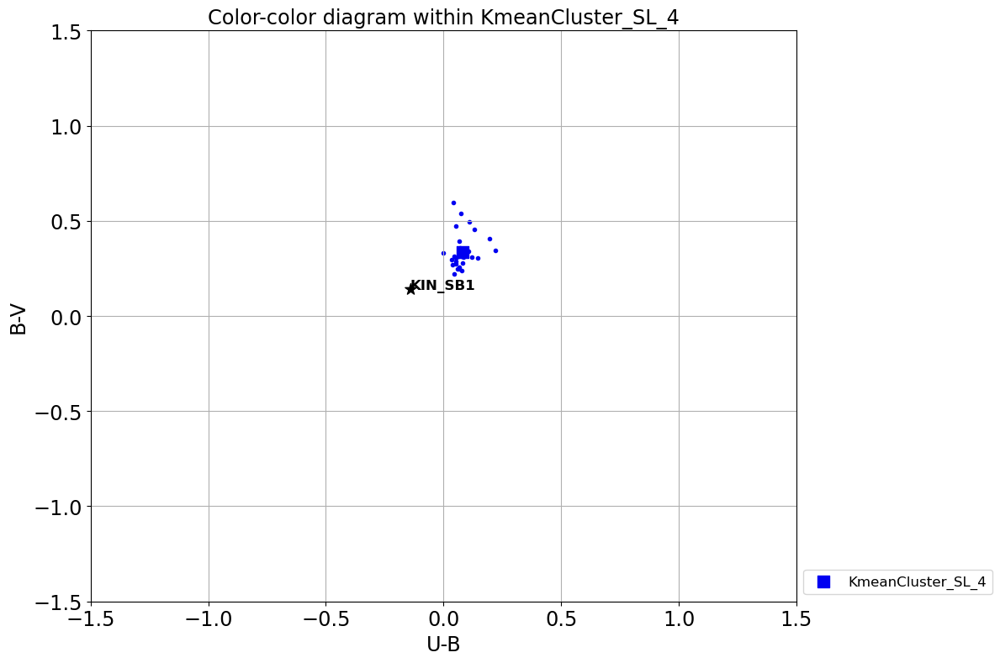

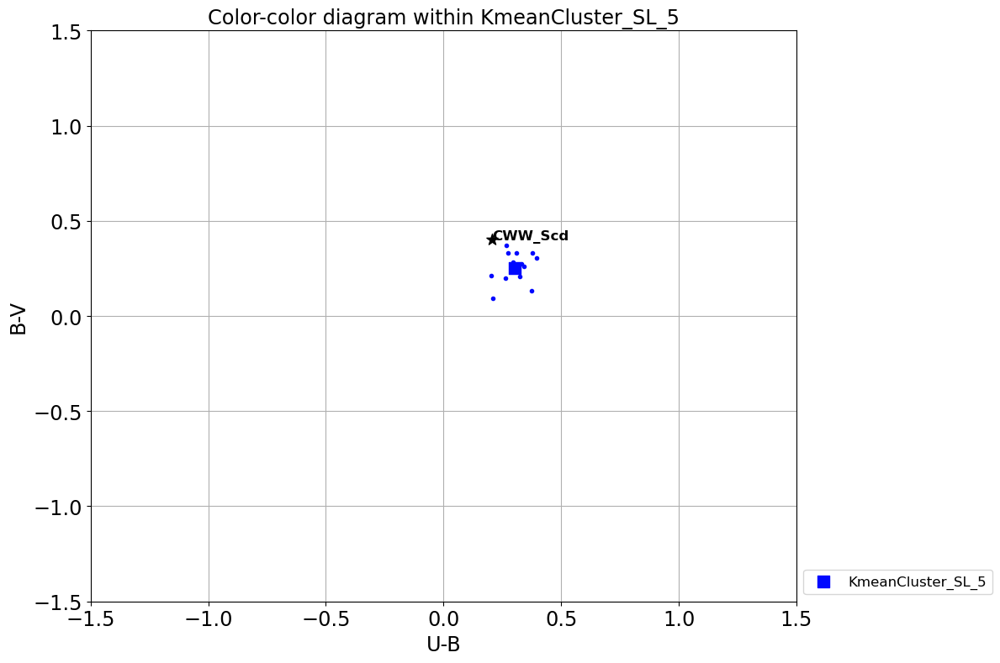

...

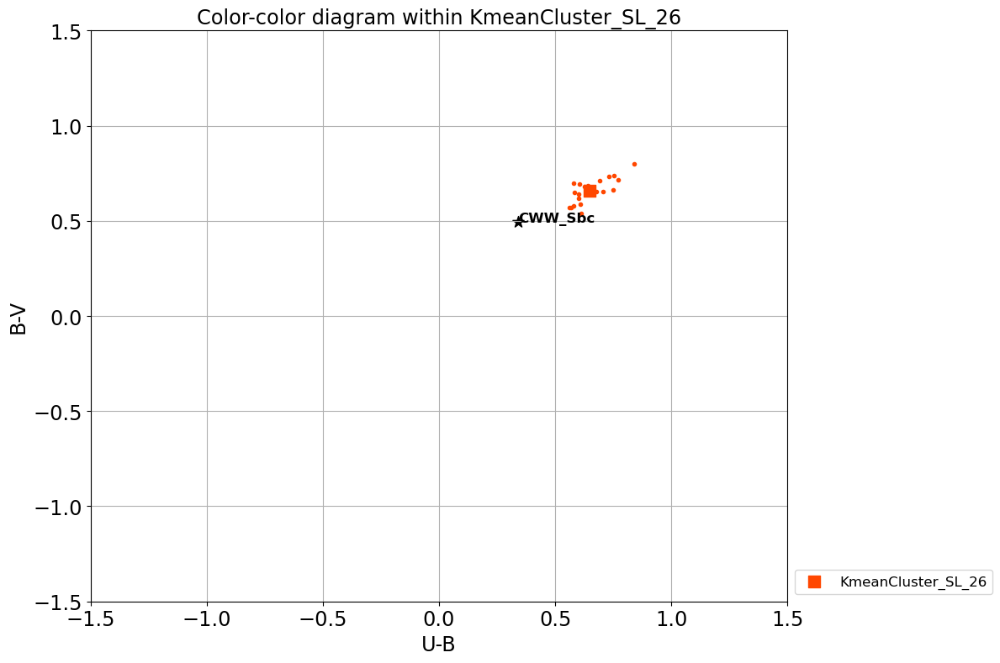

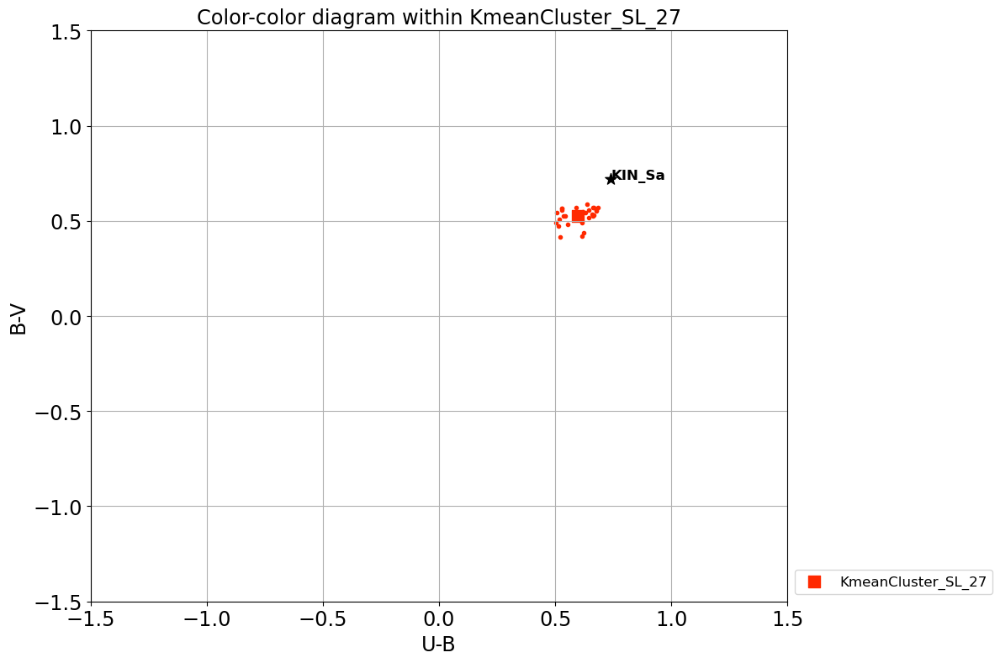

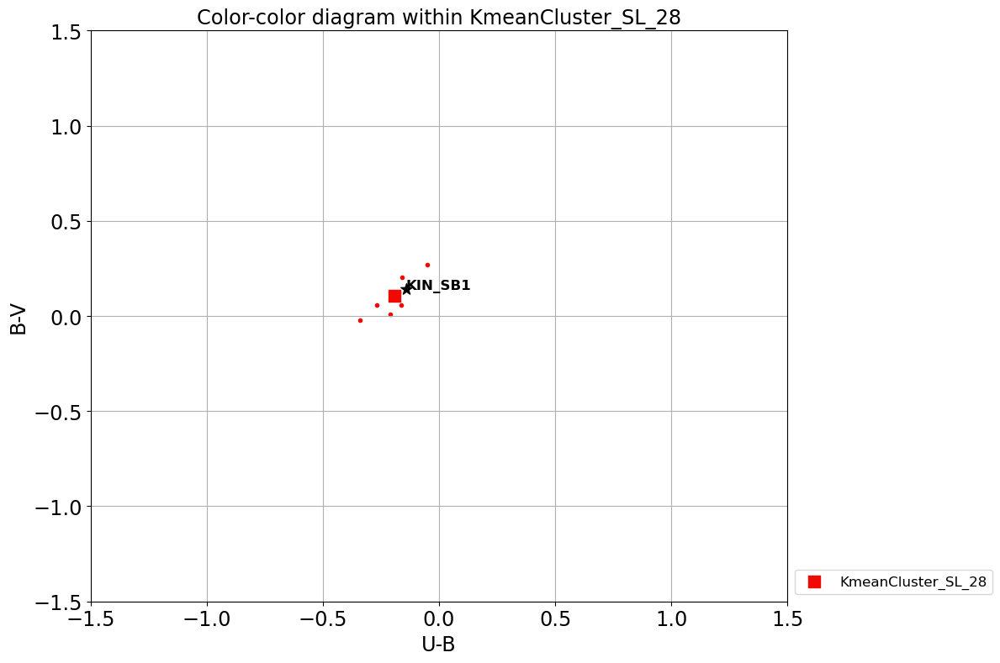

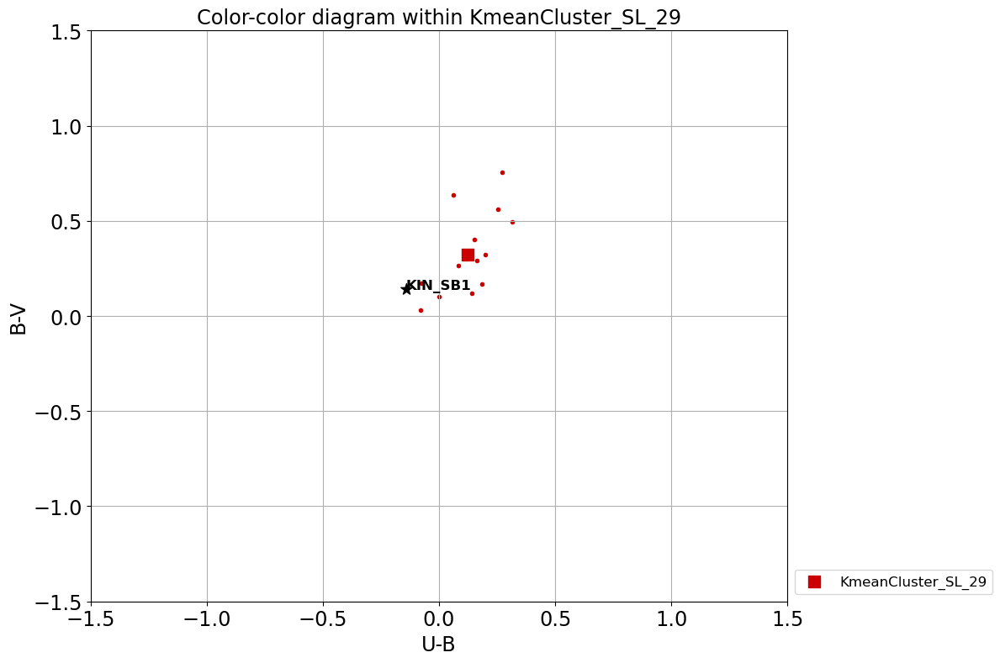

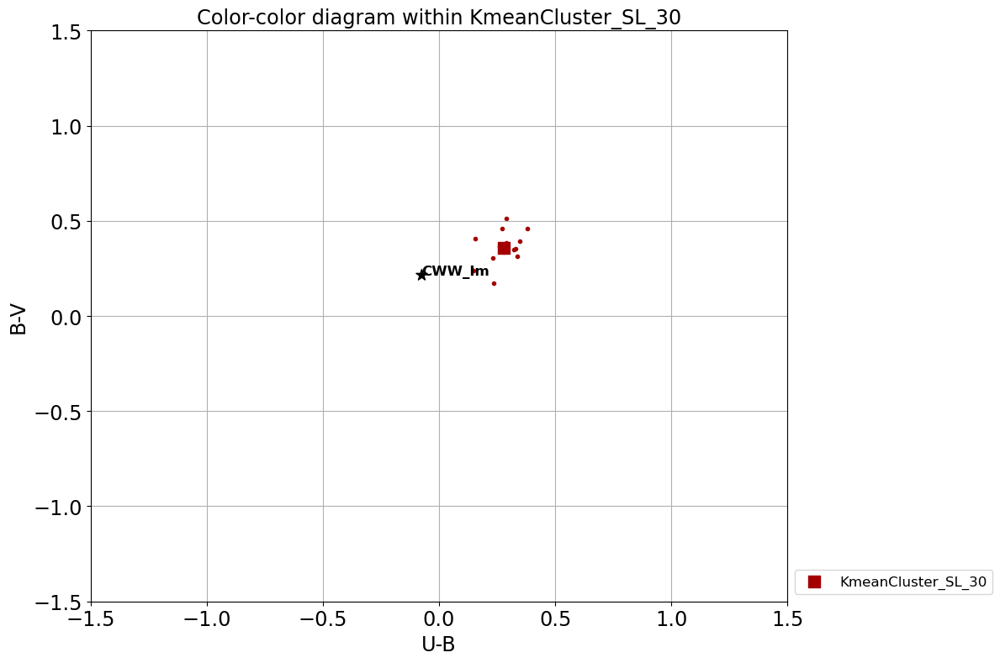

In [41]:
#z_min, z_max = 1., 0.
#for key in df_refs_dist.index:
#    _dict = new_clus_dict[key]
#    _redshifts = _dict['z_s']
#    _z_min, _z_max = np.amin(_redshifts), np.amax(_redshifts)
#    z_min, z_max = min(z_min, _z_min), max(z_max, _z_max)
#    z_max = min(1.5, z_max)
#print(z_min, z_max)

jet = plt.get_cmap('jet')
jetNorm = colors.Normalize(vmin=0, vmax=len(list(df_refs_dist.index)))
jetMap = cmx.ScalarMappable(norm=jetNorm, cmap=jet)

all_jetCols = jetMap.to_rgba(np.arange(len(list(df_refs_dist.index))), alpha=1)


_lambdas = np.array(df_cww_spec_normed['Wavelength'])
_mask = (_lambdas >= 1000.)*(_lambdas <= 10000.)
for key, col in zip(df_refs_dist.index, all_jetCols):
    f, a = plt.subplots(1, 1)
    nearest_SED = df_refs_dist.loc[key, 'Nearest_SED']
    avg_spec = df_refs_dist.loc[key, 'Template_label']
    
    _dict = new_clus_dict[key]
    _col1 = []
    _col2 = []
    for _fors2spec in _dict['ID']:
        _spec_path = os.path.join(path_BC, f'SPEC{_fors2spec}_HZ4_BC.txt')
        _spec_arr = np.loadtxt(_spec_path)
        _spec_fonc = interp1d(_spec_arr[:-1, 0], _spec_arr[:-1, 1], bounds_error=False, fill_value=0.)
        _lumins = _spec_fonc(_lambdas)
        _norm = np.trapz(_lumins[_mask], _lambdas[_mask])
        normed_spec = _lumins/_norm
        col_UB = color_index(_lambdas[_mask], normed_spec[_mask], rect_bands_dict["U"], rect_bands_dict["B"])
        col_BV = color_index(_lambdas[_mask], normed_spec[_mask], rect_bands_dict["B"], rect_bands_dict["V"])
        _col1.append(col_UB)
        _col2.append(col_BV)
        
    a.scatter(_col1, _col2, color=col, marker='.')
    

    col_UB_avg = color_index(_lambdas[_mask], df_avg_spec_normed[avg_spec][_mask], rect_bands_dict["U"], rect_bands_dict["B"])
    col_BV_avg = color_index(_lambdas[_mask], df_avg_spec_normed[avg_spec][_mask], rect_bands_dict["B"], rect_bands_dict["V"])
    
    a.scatter(col_UB_avg, col_BV_avg, color=col, label=key, marker='s', s=100)

    col_UB_cww = color_index(_lambdas[_mask], df_cww_spec_normed[nearest_SED][_mask], rect_bands_dict["U"], rect_bands_dict["B"])
    col_BV_cww = color_index(_lambdas[_mask], df_cww_spec_normed[nearest_SED][_mask], rect_bands_dict["B"], rect_bands_dict["V"])
    
    kin_name = "_".join(nearest_SED.split('_')[:2])
    
    a.scatter(col_UB_cww, col_BV_cww, color='k', s=100, marker='*')
    a.annotate(kin_name, (col_UB_cww, col_BV_cww), fontsize=12, weight='bold')
    
    a.legend(loc='lower left', bbox_to_anchor=(1., 0.))
    
    a.set_xlim(-1.5, 1.5)
    a.set_ylim(-1.5, 1.5)
    
    a.set_xlabel("U-B")
    a.set_ylabel("B-V")
    a.set_title(f"Color-color diagram within {key}")
    a.grid()
    
    f.set_tight_layout(True)
#all_figs_colors.append(f)

## Mapping selon la même méthode des SED utilisées dans le cas de référence.

### Echantillon VISTA

31
62


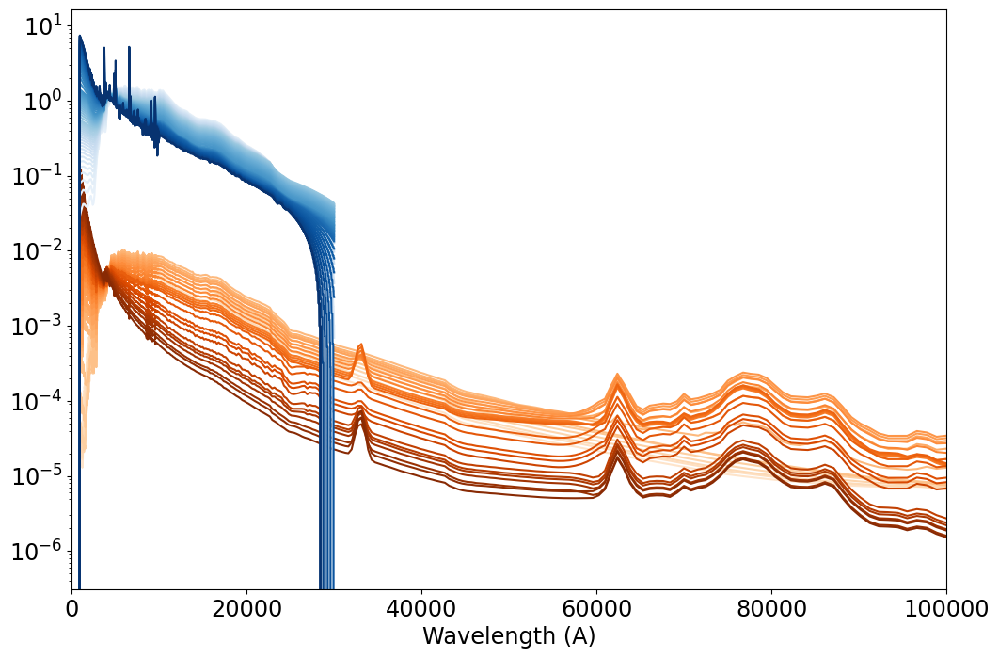

In [42]:
vista_list_file = "COSMOS_MOD.list" # CFHTLS_MOD.list
vista_dir = "COSMOS_SED" # CFHTLS_230506
with open(os.path.join(LEPHAREDIR, 'sed/GAL', vista_dir, vista_list_file),'r') as _f:
    _seds_list = _f.readlines()
paths_to_vistas = [os.path.join(LEPHAREDIR, 'sed/GAL', _sed.split(" ")[0]) for _sed in _seds_list]
print(len(paths_to_vistas))

oranges = plt.get_cmap('Oranges')
oraNorm = colors.Normalize(vmin=-5, vmax=len(paths_to_vistas))
oraMap = cmx.ScalarMappable(norm=oraNorm, cmap=oranges)

all_oranges = oraMap.to_rgba(np.arange(len(paths_to_vistas)), alpha=1)

for (_sed, col) in zip(paths_to_vistas, all_oranges):
    sed_arr = np.loadtxt(_sed)
    plt.plot(sed_arr[:, 0], sed_arr[:, 1], color=col)
    plt.xlim(0., 100000.)
    plt.yscale('log')
    

cfh_list_file = "CFHTLS_MOD.list"
cfh_dir = "CFHTLS_230506"
with open(os.path.join(LEPHAREDIR, 'sed/GAL', cfh_dir, cfh_list_file),'r') as _f:
    _seds_list = _f.readlines()
paths_to_cfhs = [os.path.join(LEPHAREDIR, 'sed/GAL', _sed.split(" ")[0]) for _sed in _seds_list]
print(len(paths_to_cfhs))

blues = plt.get_cmap('Blues')
bluNorm = colors.Normalize(vmin=-5, vmax=len(paths_to_cfhs))
bluMap = cmx.ScalarMappable(norm=bluNorm, cmap=blues)

all_blues = bluMap.to_rgba(np.arange(len(paths_to_cfhs)), alpha=1)

for (_sed, col) in zip(paths_to_cfhs, all_blues):
    sed_arr = np.loadtxt(_sed)
    plt.plot(sed_arr[:, 0], sed_arr[:, 1], color=col)
    plt.yscale('log')
    plt.xlabel('Wavelength (A)')

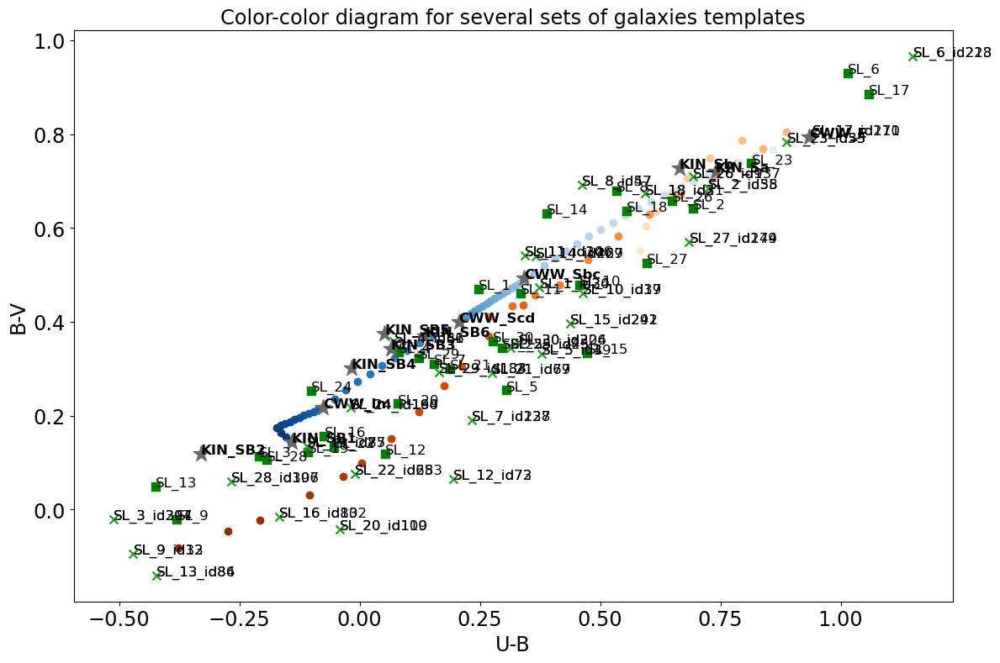

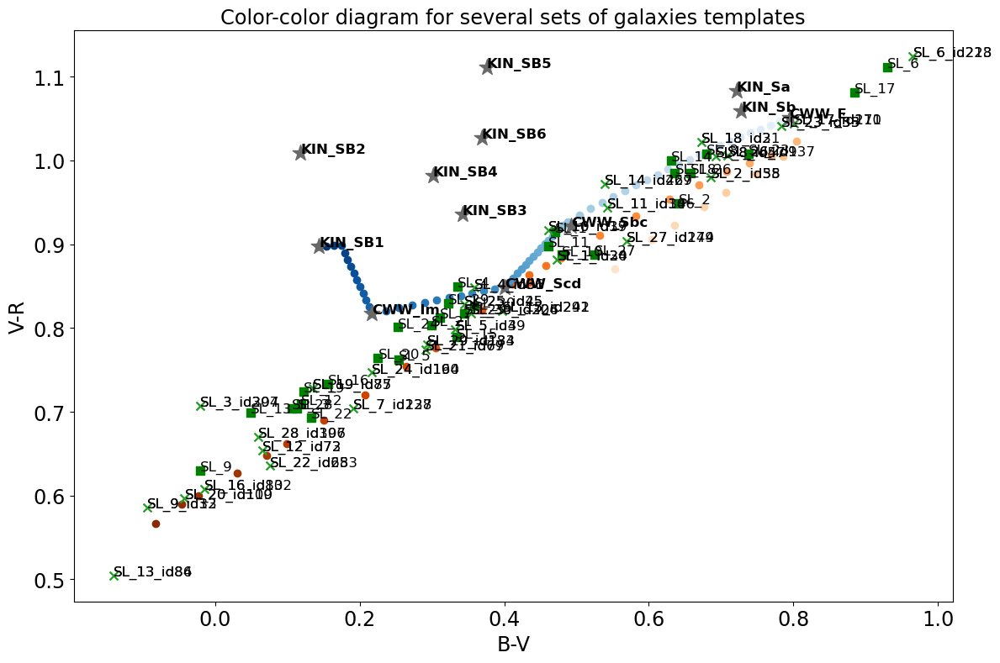

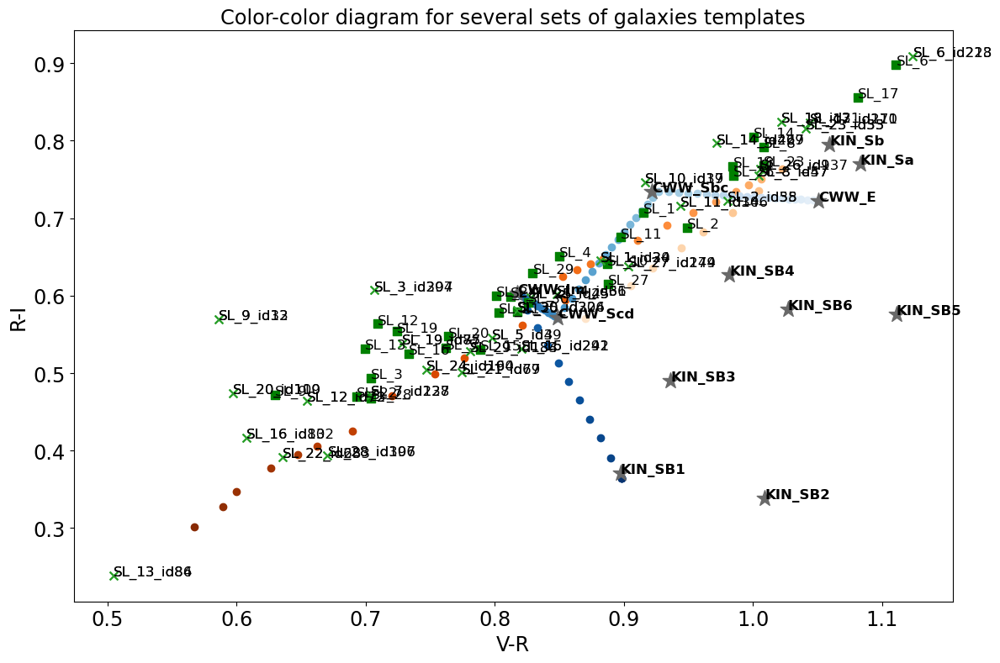

In [43]:
mag_list = ["U", "B", "V", "R", "I"]
for _c1, _c2, _c3 in zip(mag_list[:-2], mag_list[1:-1], mag_list[2:]):
    f, a = plt.subplots(1,1)

    _lambdas = np.array(df_cww_spec_normed['Wavelength'])
    _mask = (_lambdas >= 1000.)*(_lambdas <= 10000.)
    for _sed, col in zip(paths_to_vistas, all_oranges):
        _spec_arr = np.loadtxt(_sed)
        _spec_fonc = interp1d(_spec_arr[:-1, 0], _spec_arr[:-1, 1], bounds_error=False, fill_value=0.)
        _lumins = _spec_fonc(_lambdas)
        _norm = np.trapz(_lumins[_mask], _lambdas[_mask])
        normed_spec = _lumins/_norm
        col_UB = color_index(_lambdas[_mask], normed_spec[_mask], rect_bands_dict[_c1], rect_bands_dict[_c2])
        col_BV = color_index(_lambdas[_mask], normed_spec[_mask], rect_bands_dict[_c2], rect_bands_dict[_c3])
        a.scatter(col_UB, col_BV, color=col)
        
    for _sed, col in zip(paths_to_cfhs, all_blues):
        _spec_arr = np.loadtxt(_sed)
        _spec_fonc = interp1d(_spec_arr[:-1, 0], _spec_arr[:-1, 1], bounds_error=False, fill_value=0.)
        _lumins = _spec_fonc(_lambdas)
        _norm = np.trapz(_lumins[_mask], _lambdas[_mask])
        normed_spec = _lumins/_norm
        col_UB = color_index(_lambdas[_mask], normed_spec[_mask], rect_bands_dict[_c1], rect_bands_dict[_c2])
        col_BV = color_index(_lambdas[_mask], normed_spec[_mask], rect_bands_dict[_c2], rect_bands_dict[_c3])
        a.scatter(col_UB, col_BV, color=col)

    for avg_spec in df_avg_spec_normed.columns[1:]:
        if "AVG" in avg_spec:
            col_UB_avg = color_index(_lambdas[_mask], df_avg_spec_normed[avg_spec][_mask], rect_bands_dict[_c1], rect_bands_dict[_c2])
            col_BV_avg = color_index(_lambdas[_mask], df_avg_spec_normed[avg_spec][_mask], rect_bands_dict[_c2], rect_bands_dict[_c3])

            sl_num = "_".join(avg_spec.split('_')[-3:-1])
            a.scatter(col_UB_avg, col_BV_avg, color='green', marker='s', s=49)
            a.annotate(sl_num, (col_UB_avg, col_BV_avg), fontsize=12)
            
    for extr_spec in df_extr_spec_normed.columns[1:]:
        col_UB_extr = color_index(_lambdas[_mask], df_extr_spec_normed[extr_spec][_mask], rect_bands_dict[_c1], rect_bands_dict[_c2])
        col_BV_extr = color_index(_lambdas[_mask], df_extr_spec_normed[extr_spec][_mask], rect_bands_dict[_c2], rect_bands_dict[_c3])

        sl_num = "_".join(extr_spec.split('_')[-4:-1])
        a.scatter(col_UB_extr, col_BV_extr, color='tab:green', marker='x', s=49)
        a.annotate(sl_num, (col_UB_extr, col_BV_extr), fontsize=12)

    for kin_sed in df_cww_spec_normed.columns[1:]:
        col_UB_cww = color_index(_lambdas[_mask], df_cww_spec_normed[kin_sed][_mask], rect_bands_dict[_c1], rect_bands_dict[_c2])
        col_BV_cww = color_index(_lambdas[_mask], df_cww_spec_normed[kin_sed][_mask], rect_bands_dict[_c2], rect_bands_dict[_c3])

        kin_name = "_".join(kin_sed.split('_')[:2])

        a.scatter(col_UB_cww, col_BV_cww, color='dimgray', s=196, marker="*")
        a.annotate(kin_name, (col_UB_cww, col_BV_cww), fontsize=12, weight='bold')

    #a.legend(loc='lower left', bbox_to_anchor=(1., 0.))

    a.set_xlabel(f"{_c1}-{_c2}")
    a.set_ylabel(f"{_c2}-{_c3}")
    a.set_title(f"Color-color diagram for several sets of galaxies templates")

    f.set_tight_layout(True)
    #all_figs_colors.append(f)